In [1]:
from pathlib import Path
import os
cwd_path = Path.cwd(); set_path = str(cwd_path.parent.parent); os.chdir(set_path)

In [5]:
from TargetDistributions.DoubleWell import ManyWellEnergy
import torch
from FittedModels.utils.plotting_utils import plot_sampling_info, plot_divergences
torch.manual_seed(5)
from ImportanceSampling.VanillaImportanceSampler import VanillaImportanceSampling
from FittedModels.train import LearntDistributionManager
from Utils.numerical_utils import quadratic_function as expectation_function
from FittedModels.Models.FlowModel import FlowModel
from FittedModels.utils.plotting_utils import plot_history
import matplotlib.pyplot as plt
from FittedModels.utils.plotting_utils import plot_samples_vs_contours_many_well
torch.set_default_dtype(torch.float64)

In [7]:
def plotter(*args, **kwargs):
    # wrap plotting function like this so it displays during training
    plot_samples_vs_contours_many_well(*args, **kwargs)
    plt.show()

In [9]:
target = ManyWellEnergy(a=-0.5, b=-6)

# alpha=2 divergence

In [11]:
torch.manual_seed(1)
# ******************* Parameters *******************
dim = 4
epochs = int(2e4)
n_samples_estimation = int(1e5)
batch_size = int(1e3)
lr = 2e-5
train_prior = False
weight_decay = 1e-6
clip_grad_norm = False
optimizer = "Adam"
flow_type = "RealNVP"
loss_type = "DReG"
initial_flow_scaling = 1.5
n_flow_steps = 64
annealing = True
n_plots = 20
flow_kwargs = {"use_exp": True}

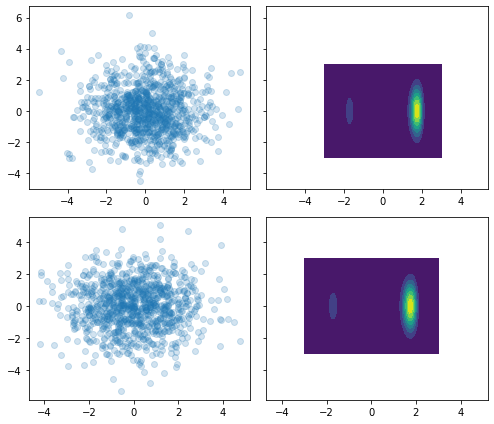

loss: -14.585680460769012, mean log p_x -6.022012919318888:   0%|          | 0/20000 [00:00<?, ?it/s]

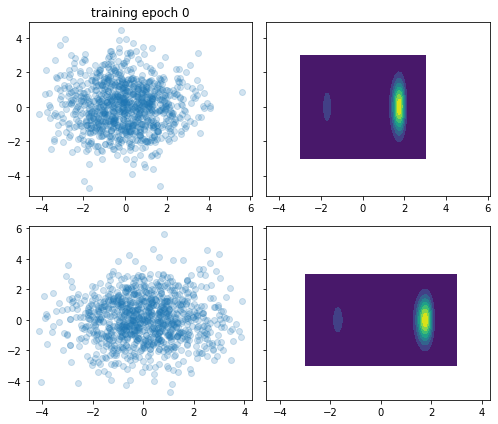

loss: -22.08661125160668, mean log p_x -5.670507208223758:   5%|▌         | 1000/20000 [03:31<1:04:31,  4.91it/s] 

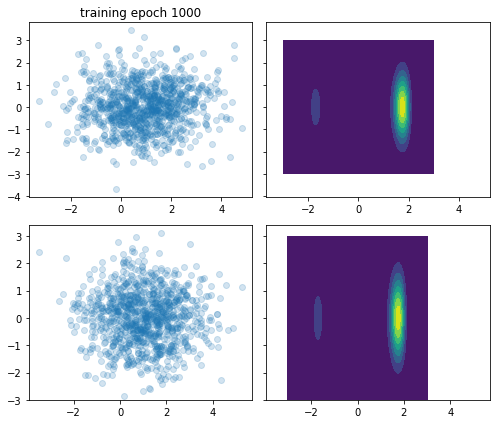

loss: -20.94662583800187, mean log p_x -13.801910582839549:  10%|█         | 2000/20000 [06:59<1:05:19,  4.59it/s] 

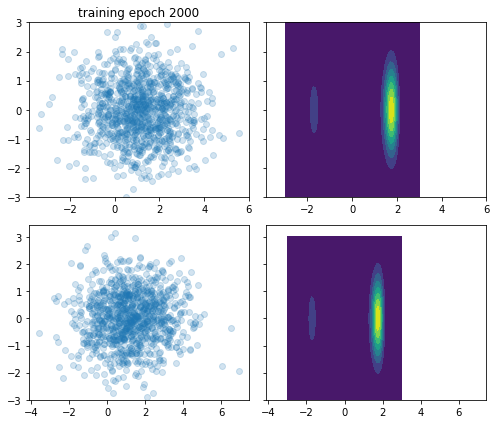

loss: -18.878835016491788, mean log p_x -20.738942124962794:  15%|█▌        | 3000/20000 [10:38<1:02:24,  4.54it/s]

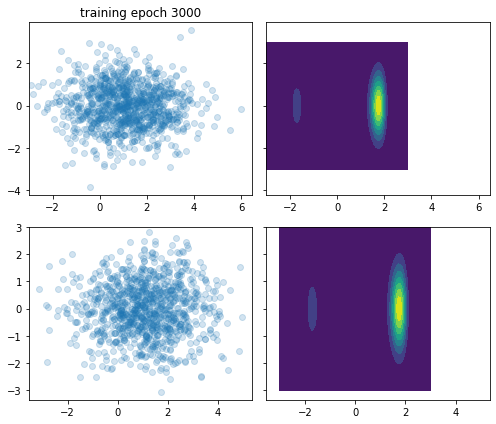

loss: -21.44802524950821, mean log p_x -5.908056839258778:  20%|██        | 4000/20000 [14:16<1:00:46,  4.39it/s]  

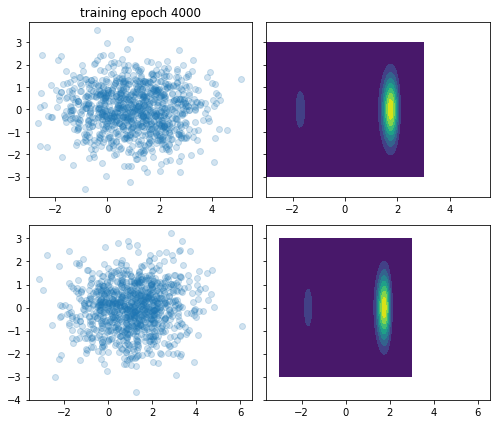

loss: -21.575302804376484, mean log p_x -4.792371468148683:  25%|██▌       | 5000/20000 [17:53<51:07,  4.89it/s]   

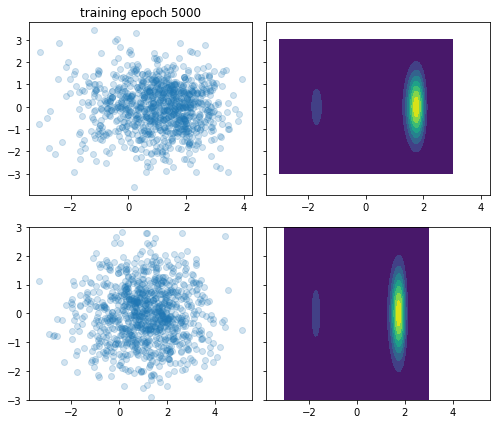

loss: -22.04632691298815, mean log p_x 1.051604196794539:  30%|███       | 6000/20000 [21:28<49:42,  4.69it/s]    

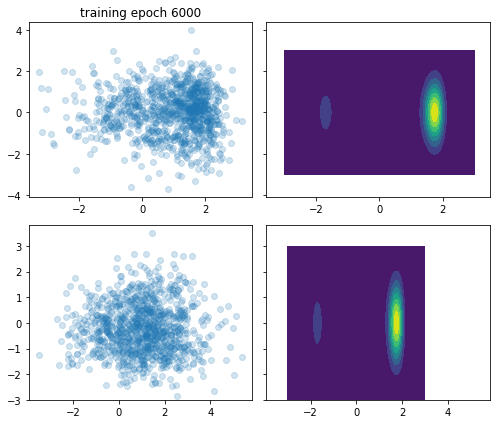

loss: -21.10704370703416, mean log p_x 3.9226421489607874:  35%|███▌      | 7000/20000 [24:55<38:19,  5.65it/s]  

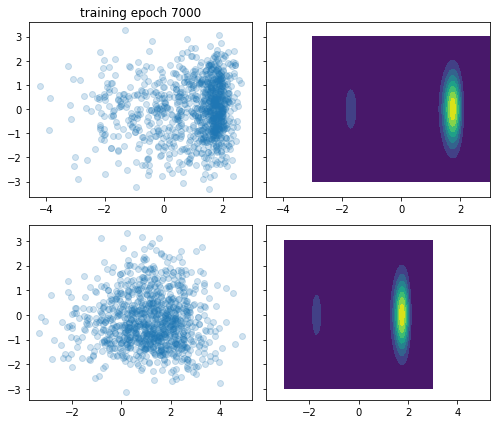

loss: -21.629536292959266, mean log p_x 7.455356595529522:  40%|████      | 8000/20000 [28:04<38:24,  5.21it/s]  

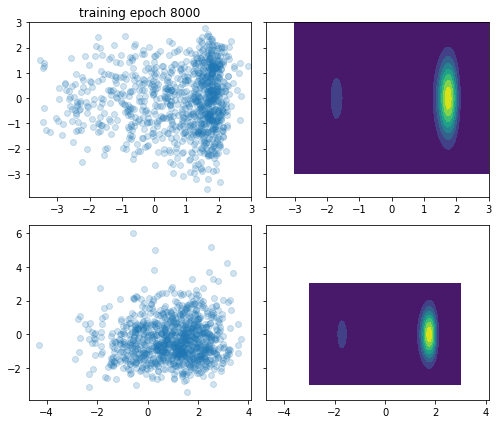

loss: -21.89372375284298, mean log p_x 9.553582852147251:  45%|████▌     | 9000/20000 [31:14<33:44,  5.43it/s]   

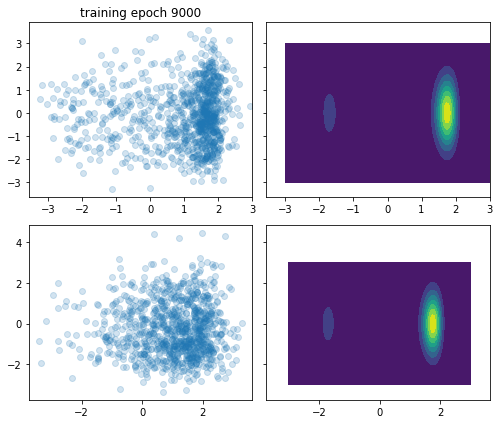

loss: -21.045977861717315, mean log p_x 9.827717677039551:  50%|█████     | 10000/20000 [34:25<30:36,  5.45it/s]

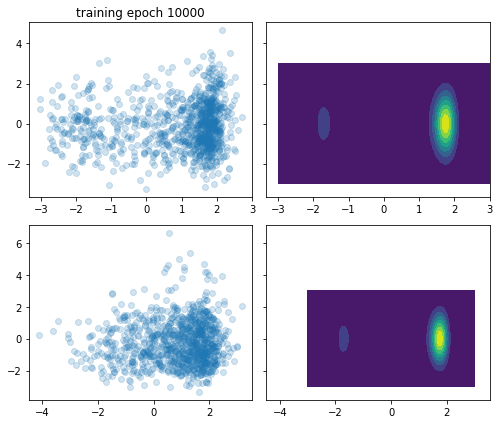

loss: -21.647428482553266, mean log p_x 11.093109740338292:  55%|█████▌    | 11000/20000 [37:40<27:55,  5.37it/s]

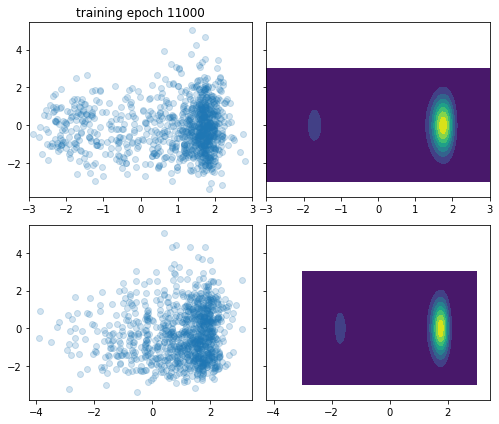

loss: -21.517530682036206, mean log p_x 10.90336115121608:  60%|██████    | 12000/20000 [40:55<24:45,  5.39it/s] 

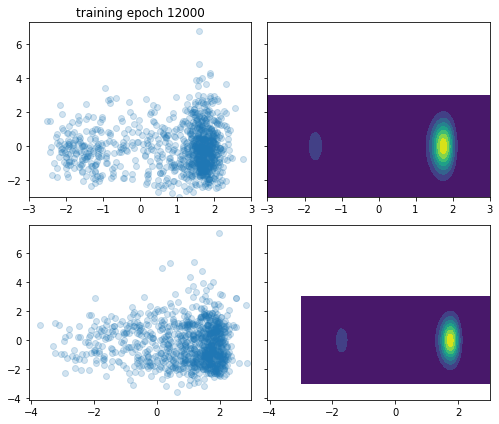

loss: -21.582757897090357, mean log p_x 11.176642788327776:  62%|██████▏   | 12409/20000 [42:14<25:50,  4.90it/s]


ValueError: The value argument must be within the support

In [12]:
torch.manual_seed(0)  # 0
learnt_sampler = FlowModel(x_dim=dim, n_flow_steps=n_flow_steps,
                           scaling_factor=initial_flow_scaling, flow_type=flow_type, **flow_kwargs)
tester = LearntDistributionManager(target, learnt_sampler, VanillaImportanceSampling, loss_type=loss_type,
                                   lr=lr, optimizer=optimizer, annealing=annealing, weight_decay=weight_decay)

plotter(tester)
plt.show()
expectation_before, info_before = tester.estimate_expectation(n_samples_estimation, expectation_function)

if train_prior:
    history_prior = tester.train_prior(epochs=200, batch_size=batch_size, lr=5e-3)
    plot_history(history_prior)
    plt.show()
    plotter(tester)
    plt.show()
    expectation_prior_trained, info_prior = tester.estimate_expectation(n_samples_estimation, expectation_function)


history = tester.train(epochs, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)
plot_history(history)
plt.show()
plot_divergences(history)
plt.show()
plot_sampling_info(history)
plt.show()

expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")

if train_prior:
    print(f"estimate after prior training is {expectation_prior_trained} \n"
        f"effective sample size trained prior is {info_prior['effective_sample_size'] / n_samples_estimation}\n")

plotter(tester, n_samples=1000)
plt.show()

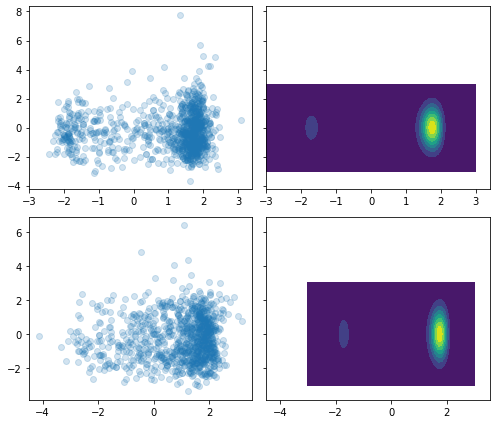

In [13]:
plotter(tester)

In [14]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")

estimate before training is 23.45107589978393 
estimate after training is 23.477456986132815 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.24111700799353614
variance in weights is 3.1473954791800755e-10


In [16]:
tester.learnt_sampling_dist.set_requires_grad(True)

loss: -21.5417228757709, mean log p_x 10.943715272412785:   0%|          | 0/1000 [00:00<?, ?it/s]

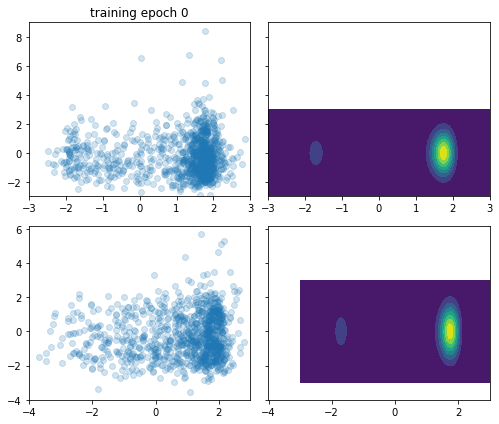

loss: -21.606219740295764, mean log p_x 11.100415557705274:   5%|▌         | 50/1000 [00:11<03:11,  4.97it/s]

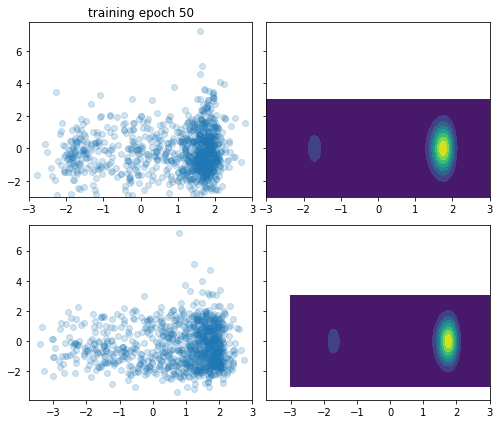

loss: -21.41571193620642, mean log p_x 11.844285014932389:  10%|█         | 100/1000 [00:21<02:44,  5.46it/s]

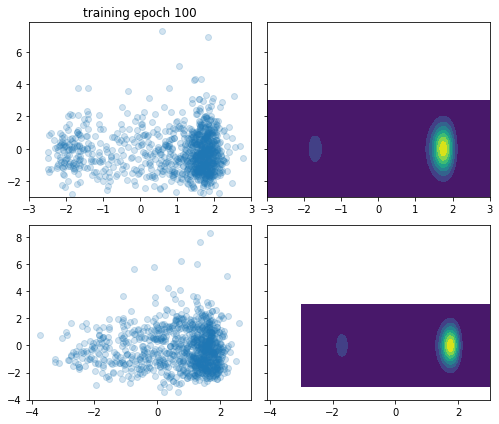

loss: -21.651560223592888, mean log p_x 11.691921696113736:  15%|█▌        | 150/1000 [00:31<02:36,  5.42it/s]

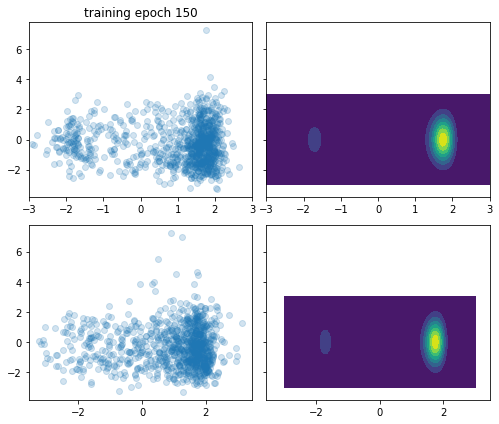

loss: -21.533944717305097, mean log p_x 11.81847081243082:  20%|██        | 200/1000 [00:42<02:27,  5.42it/s] 

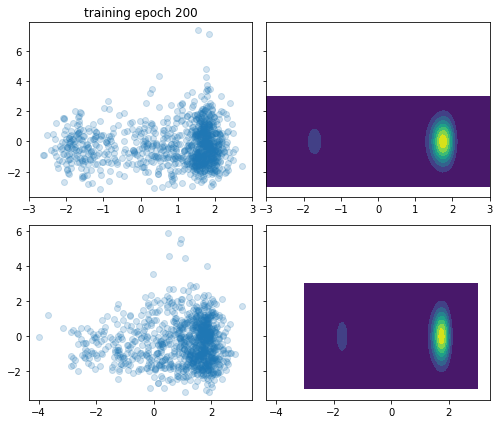

loss: -21.49104729685087, mean log p_x 11.980170138986093:  25%|██▌       | 250/1000 [00:53<02:40,  4.67it/s] 

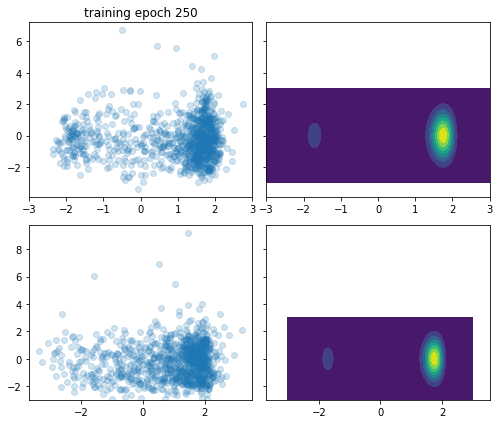

loss: -21.587796651022813, mean log p_x 11.766225715726382:  30%|███       | 300/1000 [01:03<02:09,  5.42it/s]

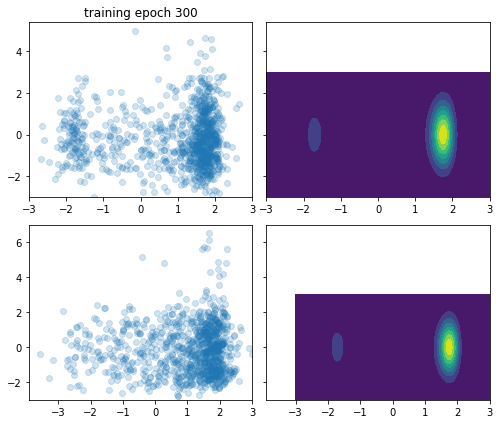

loss: -21.586317230724966, mean log p_x 11.408950456718582:  35%|███▌      | 350/1000 [01:13<01:58,  5.50it/s]

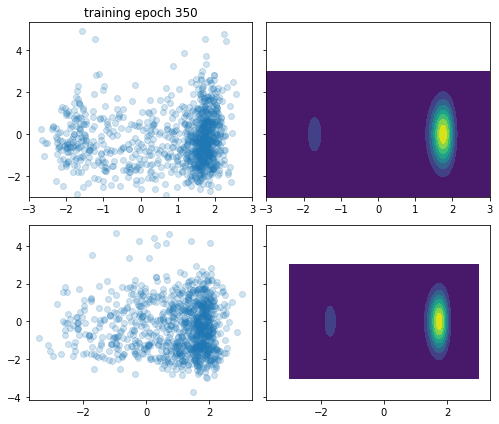

loss: -21.599451210318392, mean log p_x 11.012000042378913:  40%|████      | 400/1000 [01:24<01:58,  5.04it/s]

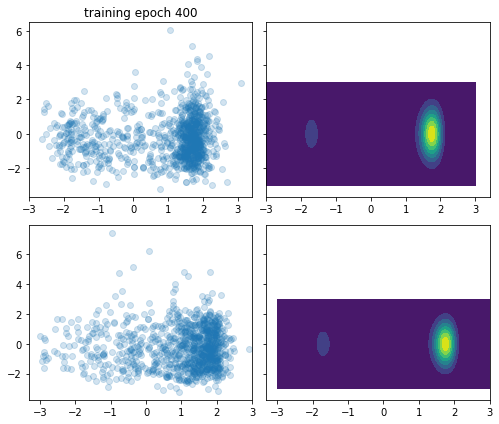

loss: -21.592638205983576, mean log p_x 11.73491798467475:  45%|████▌     | 450/1000 [01:34<01:44,  5.27it/s] 

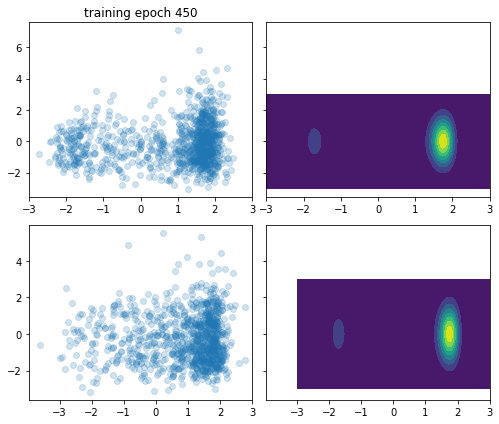

loss: -21.516443710298365, mean log p_x 11.597241724316872:  50%|█████     | 500/1000 [01:45<01:39,  5.01it/s]

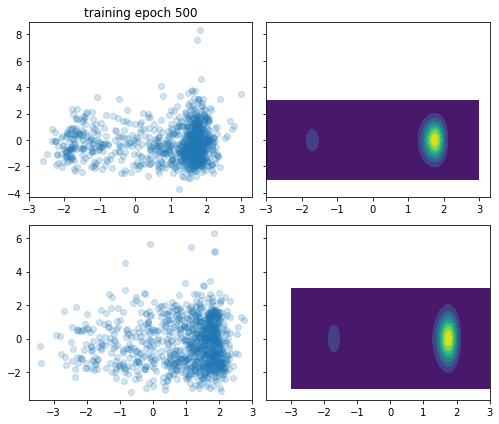

loss: -21.572569819383226, mean log p_x 11.54506578039595:  55%|█████▌    | 550/1000 [01:57<01:37,  4.62it/s] 

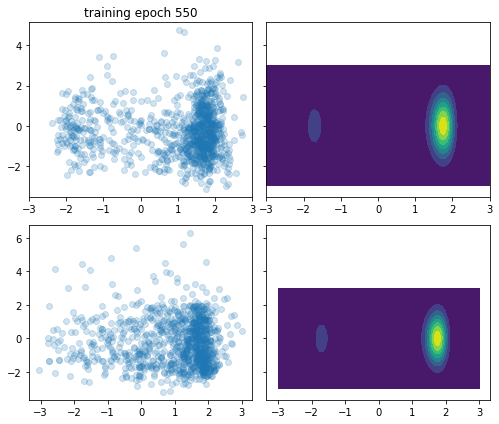

loss: -21.573203133594454, mean log p_x 11.077262893702635:  60%|██████    | 600/1000 [02:07<01:15,  5.31it/s]

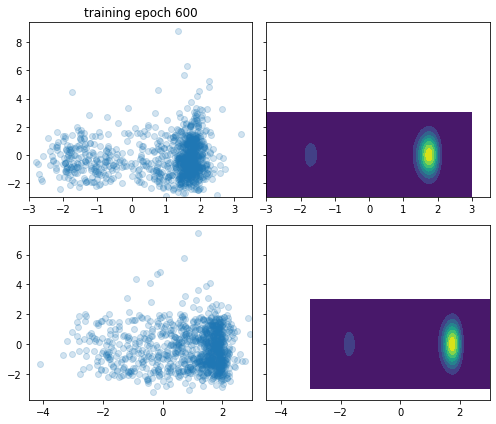

loss: -21.610658339682693, mean log p_x 11.444641478600563:  65%|██████▌   | 650/1000 [02:17<01:05,  5.35it/s]

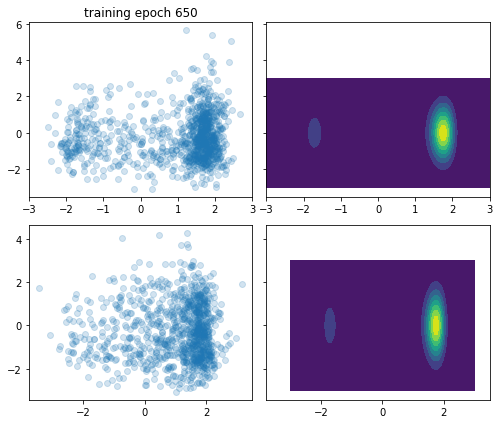

loss: -21.571223835577527, mean log p_x 11.45113430293011:  70%|███████   | 700/1000 [02:28<00:55,  5.43it/s] 

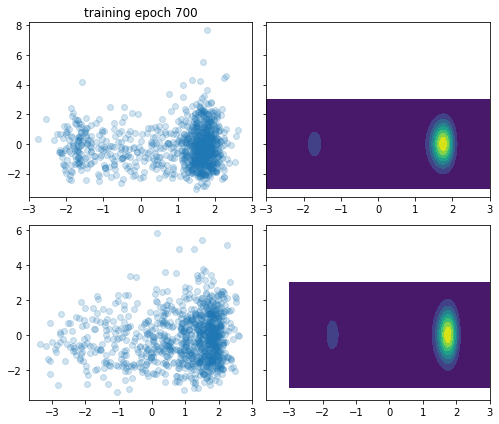

loss: -21.494173153217748, mean log p_x 11.491024302555198:  75%|███████▌  | 750/1000 [02:38<00:46,  5.43it/s]

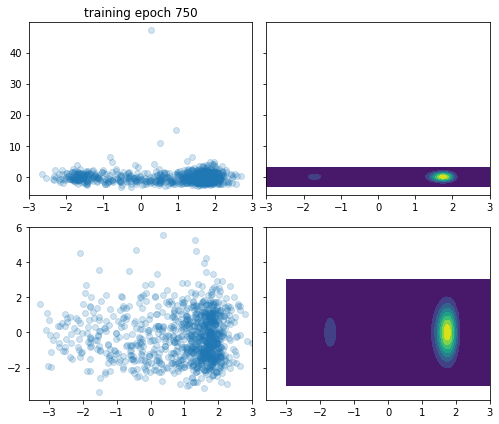

loss: -21.621512798552573, mean log p_x 11.25272875176636:  80%|████████  | 800/1000 [02:48<00:37,  5.34it/s] 

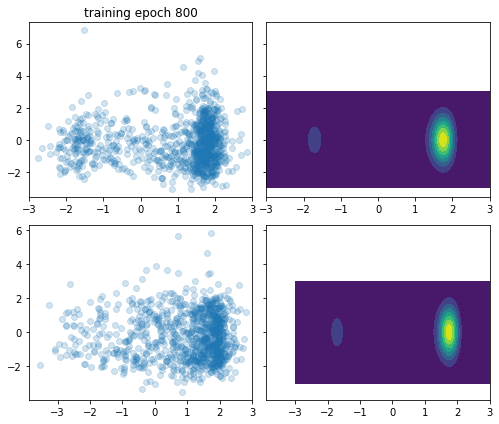

loss: -21.28826324179157, mean log p_x 11.500139055569909:  85%|████████▌ | 850/1000 [02:58<00:27,  5.47it/s] 

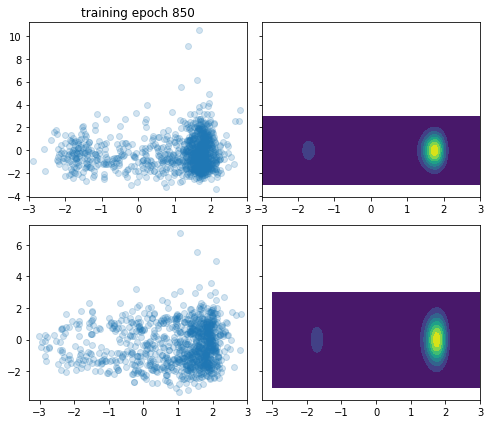

loss: -21.57970405122692, mean log p_x 11.650873884865597:  90%|█████████ | 900/1000 [03:08<00:18,  5.43it/s] 

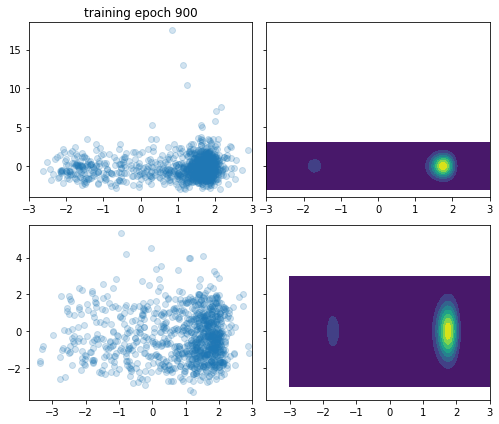

loss: -21.54273141456371, mean log p_x 11.625512878290166:  95%|█████████▌| 950/1000 [03:18<00:09,  5.39it/s] 

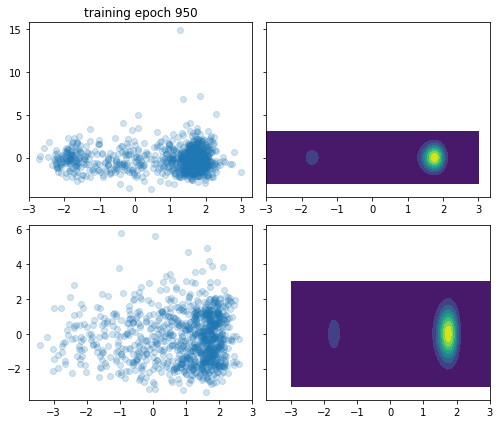

loss: -21.49972888252414, mean log p_x 11.448182293364406: 100%|██████████| 1000/1000 [03:28<00:00,  4.79it/s]


In [17]:
history = tester.train(1000, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

In [18]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")

estimate before training is 23.45107589978393 
estimate after training is 23.468510292400204 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.25054616404408375
variance in weights is 2.991310337672394e-10


NaN encountered in alpha_2_divergence history


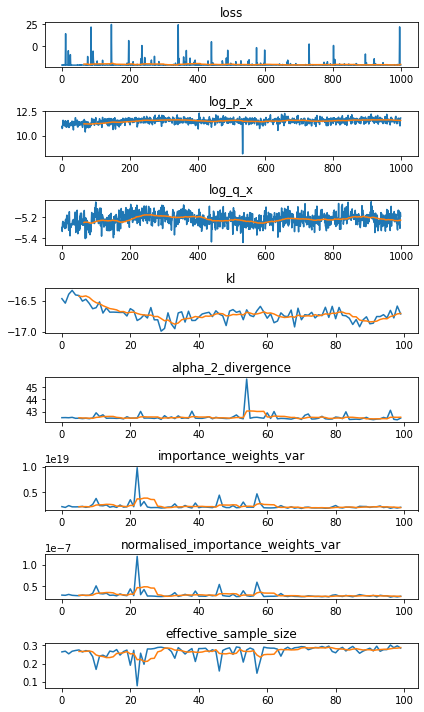

In [19]:
plot_history(history)

loss: -21.58946583564837, mean log p_x 11.70791580564644:   0%|          | 0/10000 [00:00<?, ?it/s]

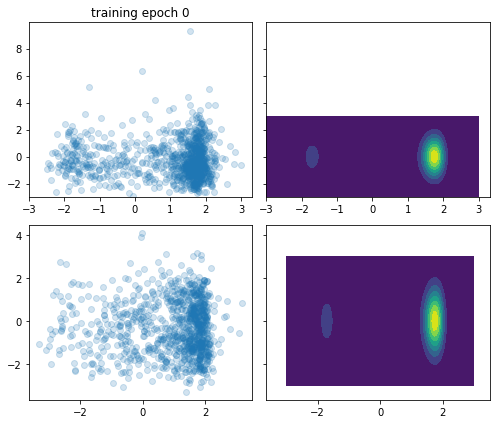

loss: -21.361535584635252, mean log p_x 11.688747049497616:   5%|▌         | 500/10000 [01:36<32:48,  4.83it/s]

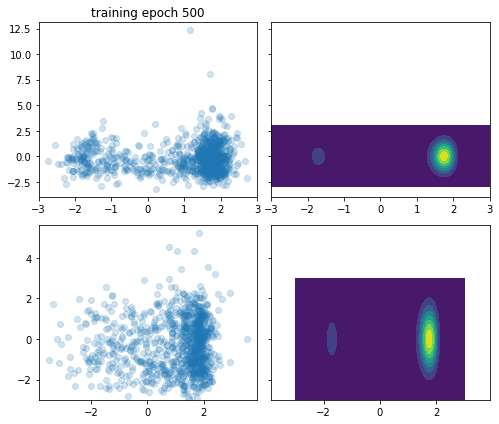

loss: -21.637341657587584, mean log p_x 12.038633137387478:   7%|▋         | 684/10000 [02:13<30:23,  5.11it/s]  


ValueError: The value argument must be within the support

In [20]:
history = tester.train(10000, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

In [22]:
tester.learnt_sampling_dist.set_requires_grad(True)

loss: -21.290920919440513, mean log p_x 12.214920279043197:   0%|          | 0/300 [00:00<?, ?it/s]

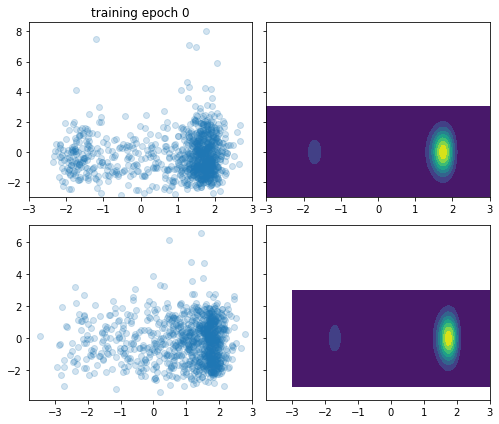

loss: -21.452564072811867, mean log p_x 11.77940873395748:   5%|▌         | 15/300 [00:04<01:06,  4.28it/s] 

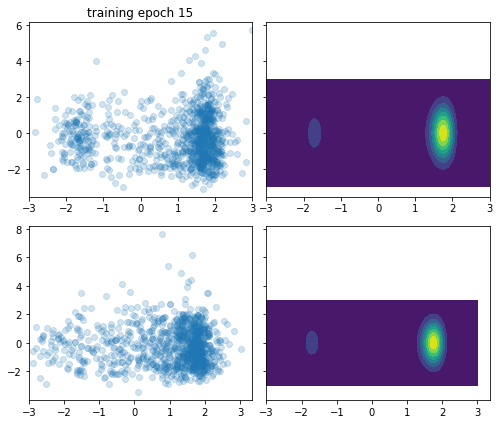

loss: -21.565655073546107, mean log p_x 11.983635498253696:  10%|█         | 30/300 [00:08<01:00,  4.45it/s]

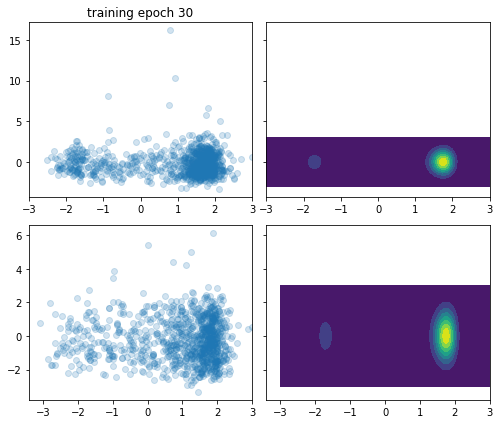

loss: -21.40322391305622, mean log p_x 11.997355214234737:  15%|█▌        | 45/300 [00:12<00:57,  4.46it/s] 

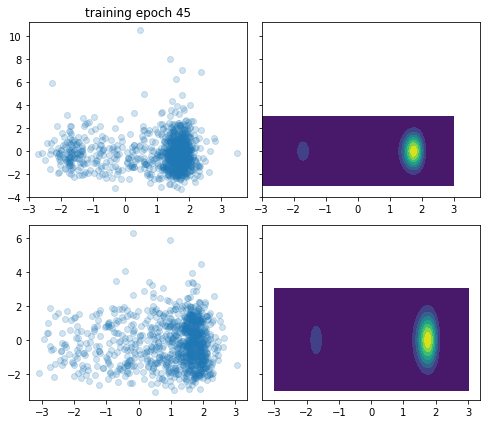

loss: -21.535851877339926, mean log p_x 12.065921751468089:  20%|██        | 60/300 [00:16<00:54,  4.42it/s]

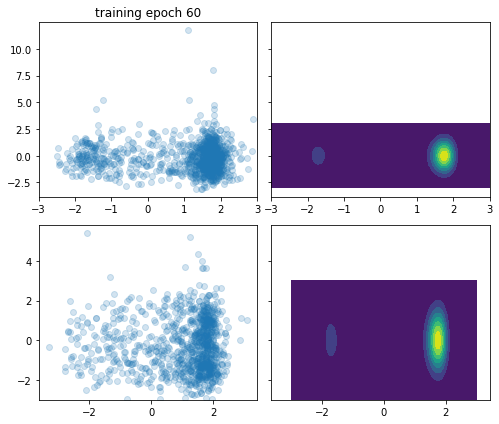

loss: -21.46042696500015, mean log p_x 12.421988525273337:  25%|██▌       | 75/300 [00:21<00:58,  3.84it/s] 

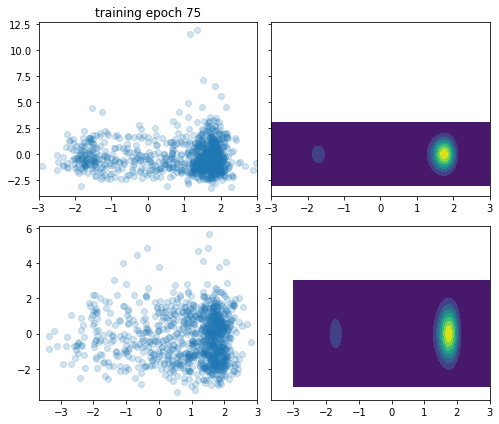

loss: -21.556244176968434, mean log p_x 11.889101832347672:  30%|███       | 90/300 [00:25<00:47,  4.39it/s]

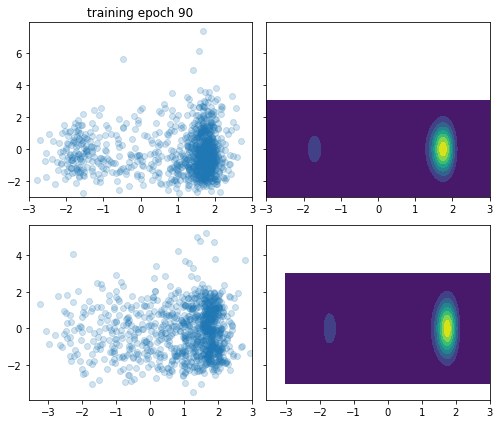

loss: -21.528696628872062, mean log p_x 12.628487592943461:  35%|███▌      | 105/300 [00:29<00:44,  4.41it/s]

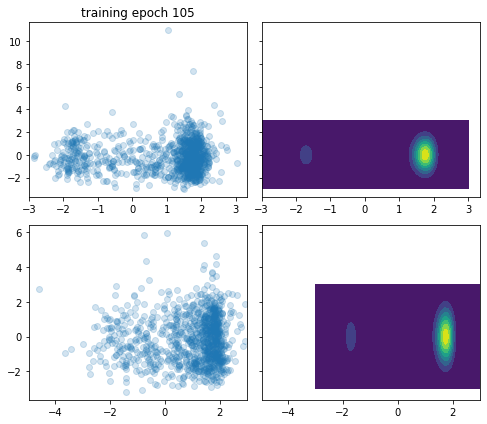

loss: -21.507992208688542, mean log p_x 11.622667105413745:  40%|████      | 120/300 [00:33<00:41,  4.31it/s]

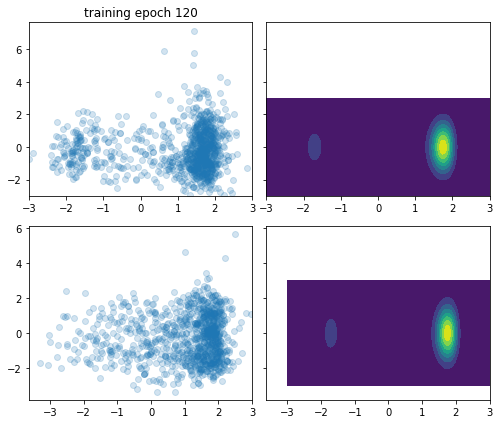

loss: -21.60332117500026, mean log p_x 11.973756452732255:  45%|████▌     | 135/300 [00:37<00:37,  4.44it/s] 

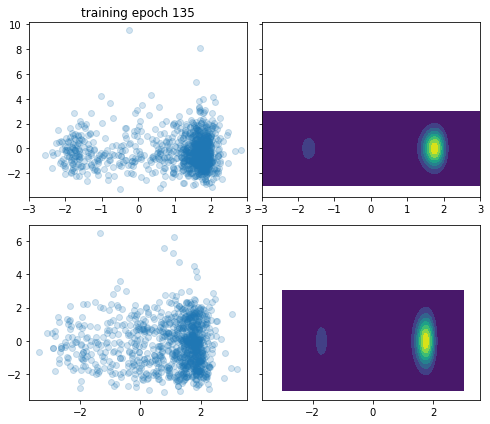

loss: -21.505945515106745, mean log p_x 11.451667735382511:  50%|█████     | 150/300 [00:42<00:33,  4.44it/s]

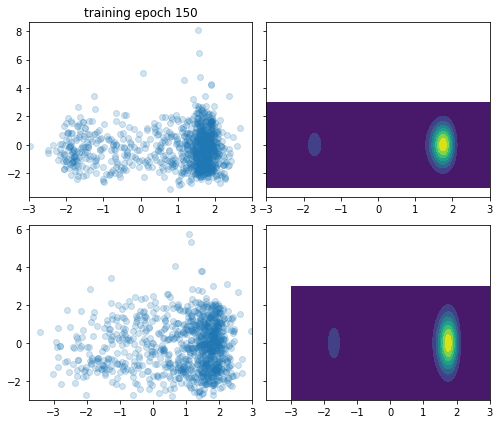

loss: -21.520623273882016, mean log p_x 11.699124623258664:  55%|█████▌    | 165/300 [00:46<00:33,  4.02it/s]

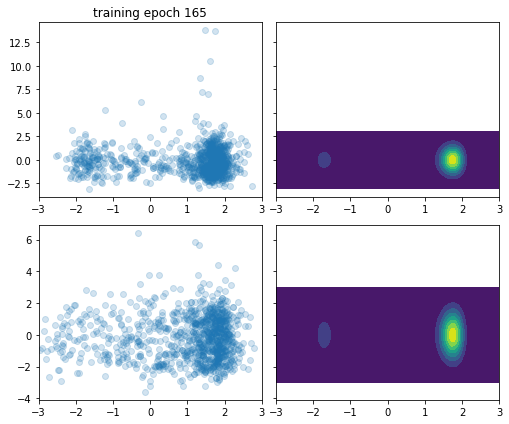

loss: -21.552615271690655, mean log p_x 11.865587927027681:  60%|██████    | 180/300 [00:51<00:29,  4.04it/s]

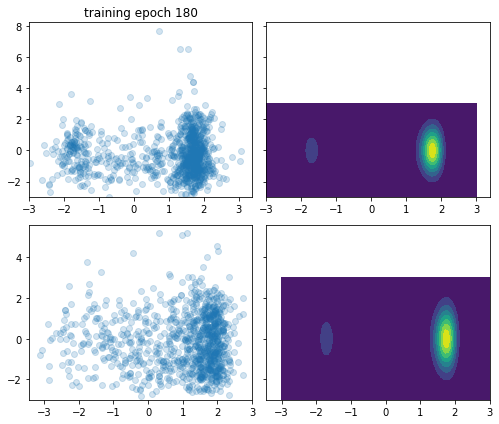

loss: -21.506830879288536, mean log p_x 12.107851129811168:  65%|██████▌   | 195/300 [00:55<00:23,  4.48it/s]

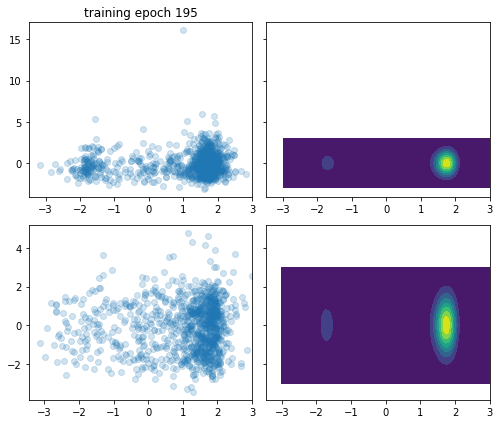

loss: -21.631303446071207, mean log p_x 12.159724265737733:  70%|███████   | 210/300 [00:59<00:20,  4.46it/s]

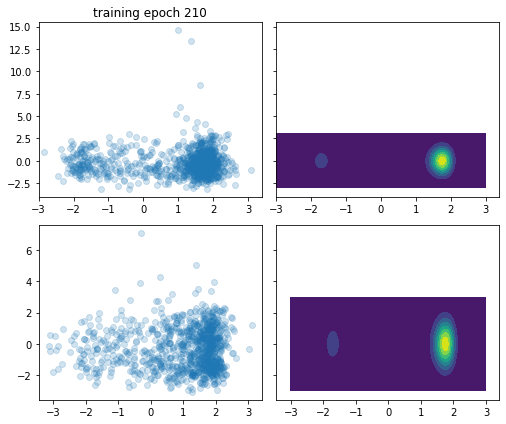

loss: -21.584216341197042, mean log p_x 12.085080607207503:  75%|███████▌  | 225/300 [01:03<00:16,  4.48it/s]

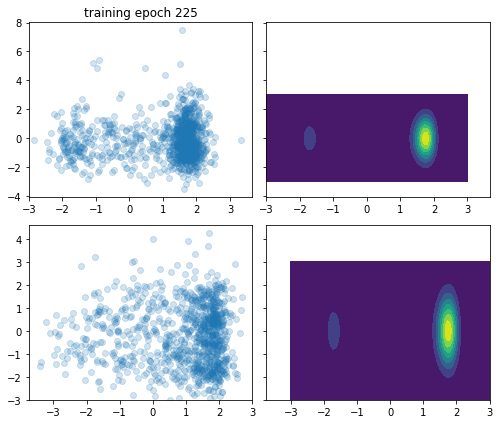

loss: -21.55315283729443, mean log p_x 12.420070982276764:  80%|████████  | 240/300 [01:07<00:13,  4.29it/s] 

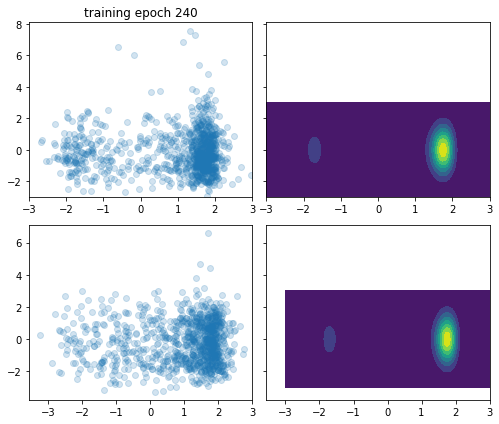

loss: -21.542139928201536, mean log p_x 12.206744310007918:  85%|████████▌ | 255/300 [01:11<00:10,  4.30it/s]

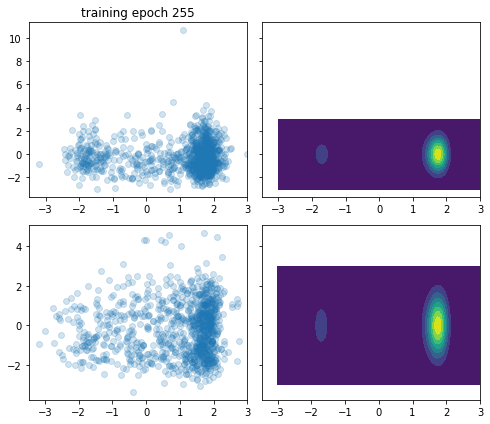

loss: -21.570955965534075, mean log p_x 12.71907682493638:  90%|█████████ | 270/300 [01:16<00:06,  4.42it/s] 

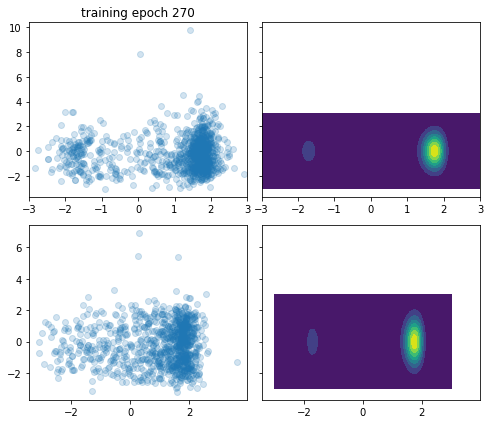

loss: -21.546917748286447, mean log p_x 12.231979618877459:  95%|█████████▌| 285/300 [01:20<00:03,  4.50it/s]

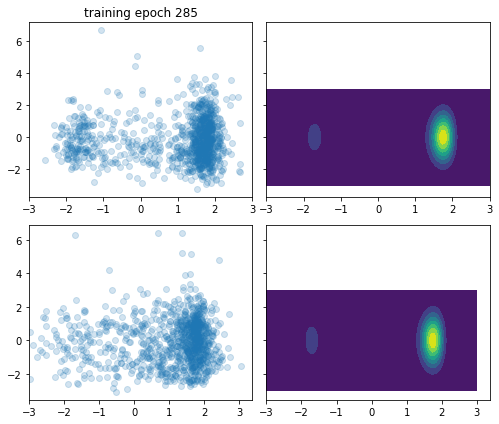

loss: -21.437104053333442, mean log p_x 12.14630972629419: 100%|██████████| 300/300 [01:23<00:00,  3.57it/s] 


In [23]:
history = tester.train(300, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

estimate before training is 23.45107589978393 
estimate after training is 23.426541324248877 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.25870665940117665
variance in weights is 2.865410404673141e-10
NaN encountered in alpha_2_divergence history


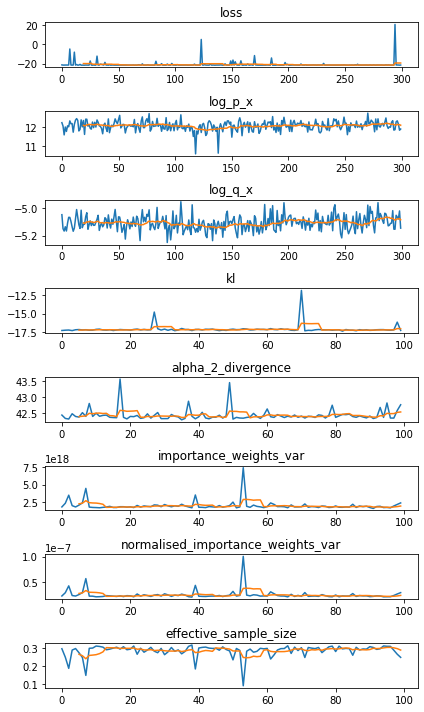

In [24]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")
plot_history(history)

loss: -21.54146833343235, mean log p_x 12.212227222285115:   0%|          | 0/500 [00:00<?, ?it/s]

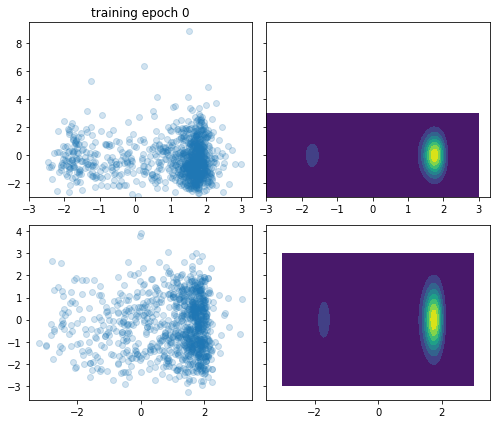

loss: -21.61990639263999, mean log p_x 12.338827799072435:   5%|▌         | 25/500 [00:06<01:36,  4.91it/s] 

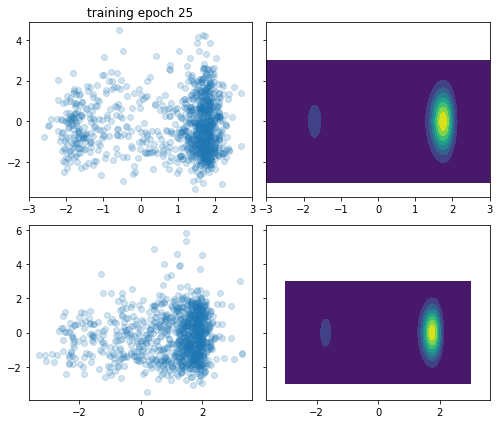

loss: -21.529091480582352, mean log p_x 11.87447152815738:  10%|█         | 50/500 [00:12<01:36,  4.66it/s] 

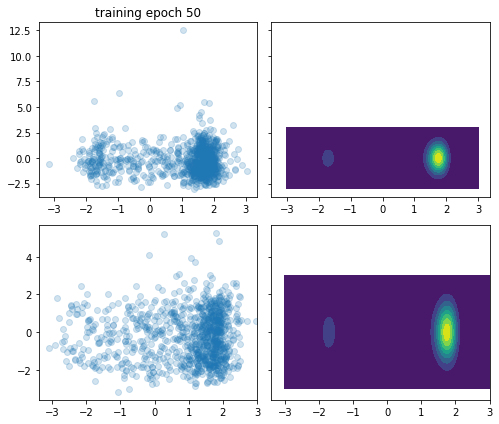

loss: -21.497265130581123, mean log p_x 12.025261879660972:  15%|█▌        | 75/500 [00:18<01:30,  4.70it/s]

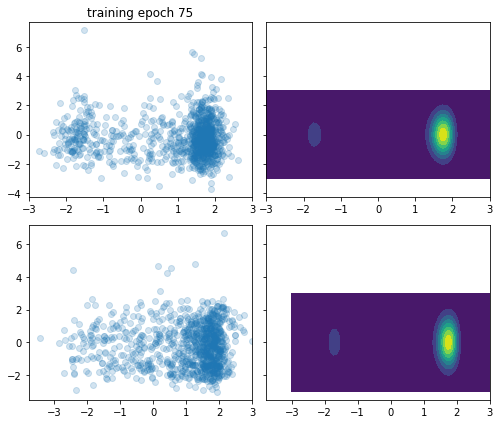

loss: -3.758739734062118, mean log p_x 12.085581322461522:  20%|██        | 100/500 [00:24<01:25,  4.70it/s]

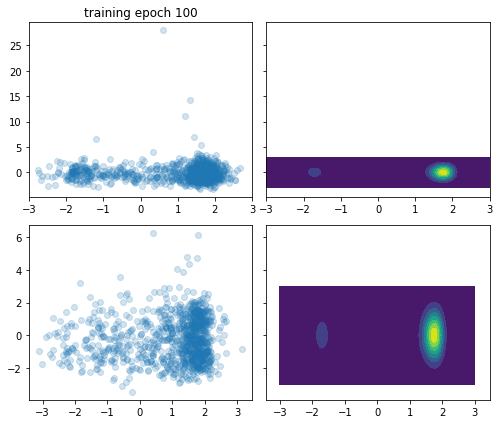

loss: -21.548834703904134, mean log p_x 11.64923834345356:  25%|██▌       | 125/500 [00:31<01:19,  4.71it/s] 

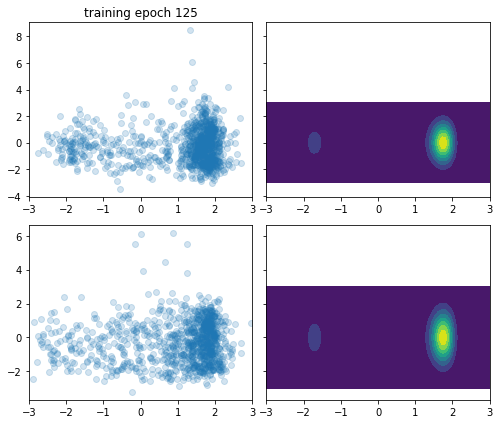

loss: -21.519670623179003, mean log p_x 12.289717313016782:  30%|███       | 150/500 [00:37<01:12,  4.84it/s]

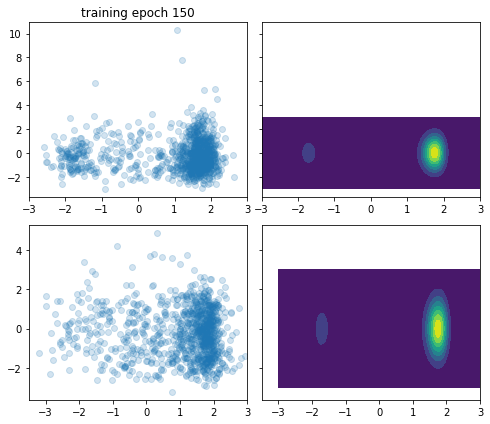

loss: -21.49811564896517, mean log p_x 12.458809062405681:  35%|███▌      | 175/500 [00:43<01:07,  4.79it/s] 

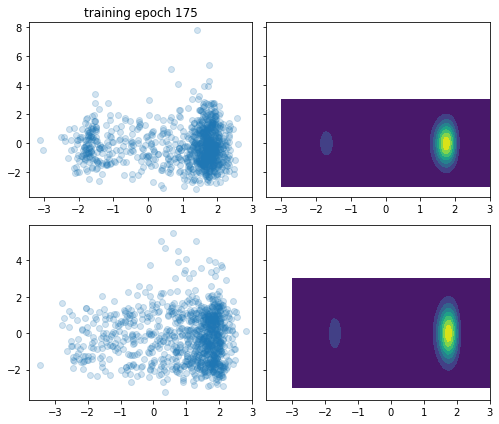

loss: -21.4585576317306, mean log p_x 12.217998492415836:  40%|████      | 200/500 [00:49<01:02,  4.81it/s]  

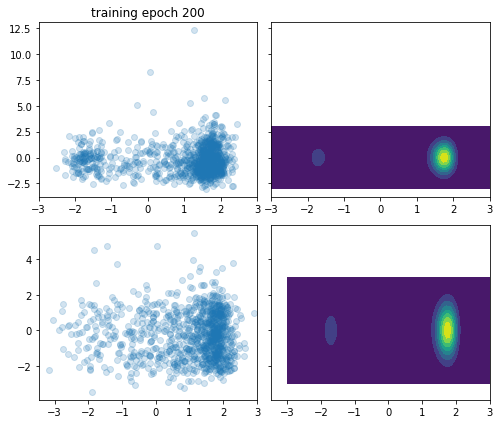

loss: -21.460914298895474, mean log p_x 12.01240692229301:  45%|████▌     | 225/500 [00:56<00:57,  4.74it/s]

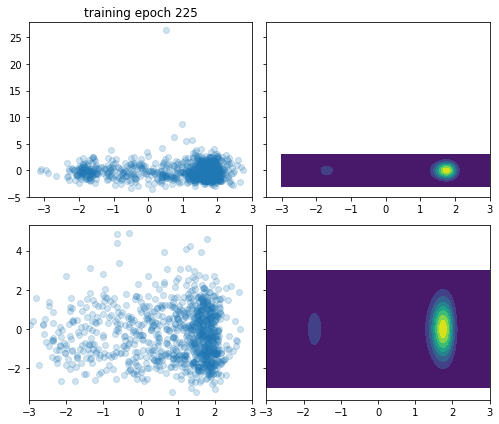

loss: -21.521509368144322, mean log p_x 12.164958674826055:  50%|█████     | 250/500 [01:02<00:53,  4.67it/s]

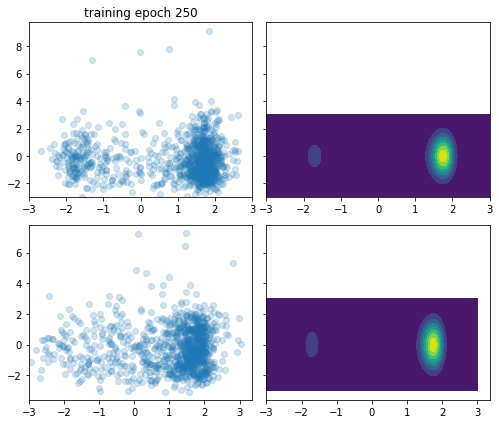

loss: -17.188035776512493, mean log p_x 11.484412506120947:  55%|█████▌    | 275/500 [01:08<00:45,  4.91it/s]

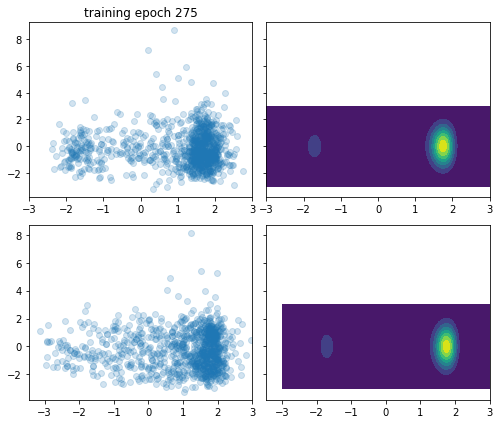

loss: -21.107266995565702, mean log p_x 12.445218583374077:  60%|██████    | 300/500 [01:14<00:43,  4.61it/s]

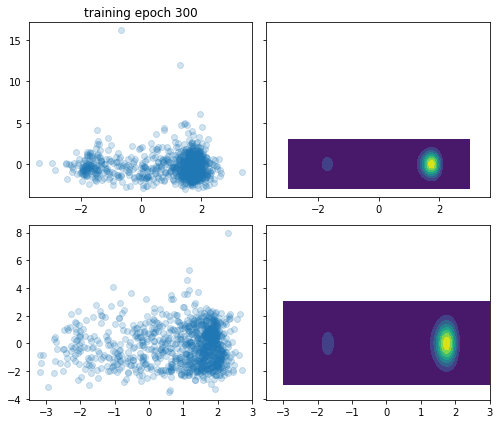

loss: -21.418078362970405, mean log p_x 12.224989801951262:  65%|██████▌   | 325/500 [01:20<00:37,  4.64it/s]

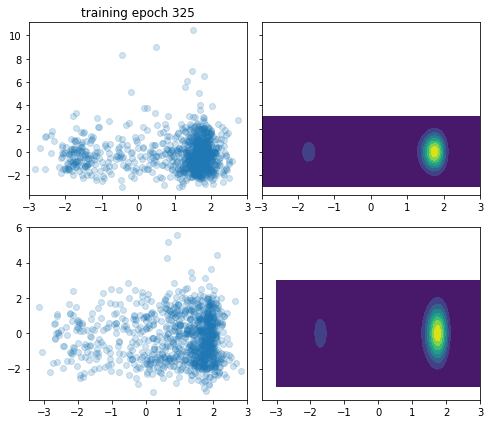

loss: -21.407709155957114, mean log p_x 11.660930525921103:  70%|███████   | 350/500 [01:26<00:30,  4.94it/s]

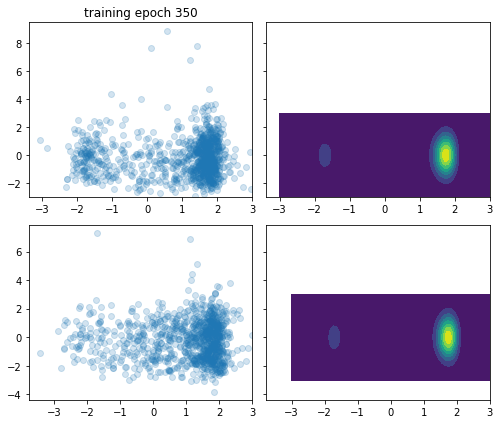

loss: -21.554741556451795, mean log p_x 11.975846822084957:  75%|███████▌  | 375/500 [01:33<00:27,  4.59it/s]

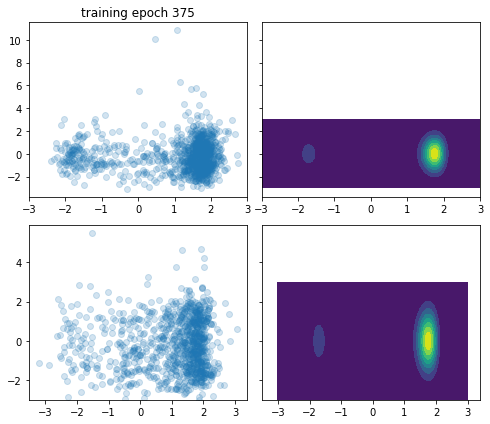

loss: -21.484936759937035, mean log p_x 12.35546391901473:  80%|████████  | 400/500 [01:39<00:21,  4.67it/s] 

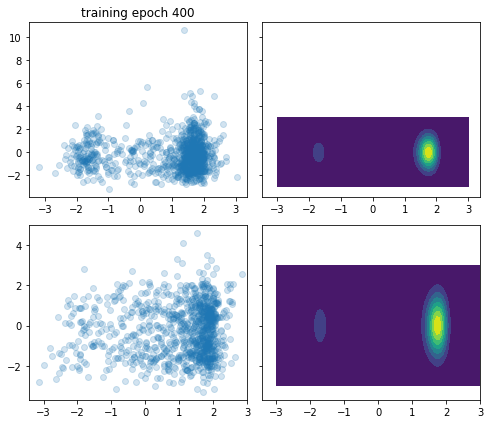

loss: -21.41840518383852, mean log p_x 12.236157118400524:  85%|████████▌ | 425/500 [01:45<00:16,  4.63it/s] 

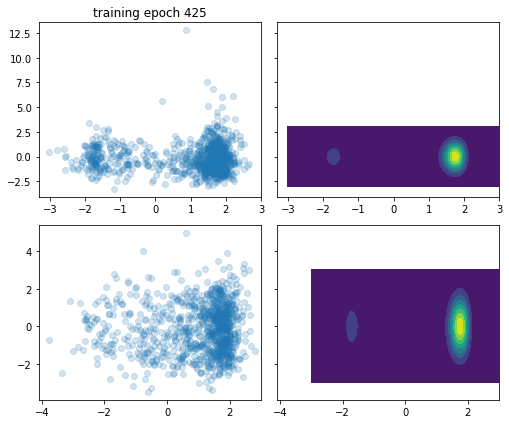

loss: -21.495640382423787, mean log p_x 12.392273462016735:  90%|█████████ | 450/500 [01:51<00:10,  4.83it/s]

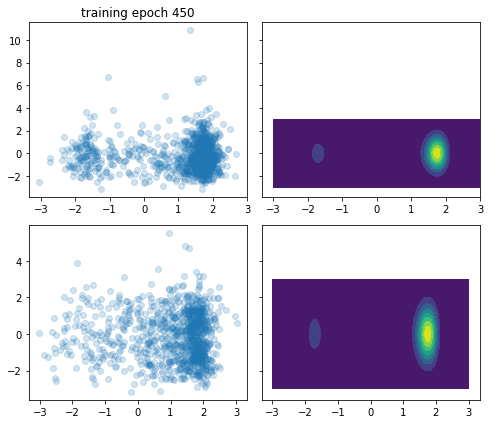

loss: -21.104868024702252, mean log p_x 11.996544250772097:  95%|█████████▌| 475/500 [01:57<00:05,  4.81it/s]

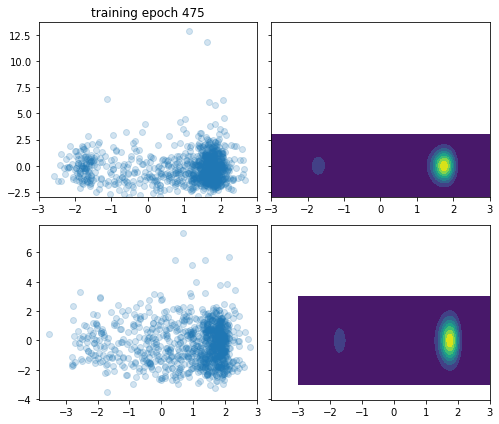

loss: -21.48792476185997, mean log p_x 12.00843530594121: 100%|██████████| 500/500 [02:03<00:00,  4.04it/s]  


In [25]:
history = tester.train(500, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

estimate before training is 23.45107589978393 
estimate after training is 23.427931959734405 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.279942681760042
variance in weights is 2.57218554297614e-10
NaN encountered in kl history


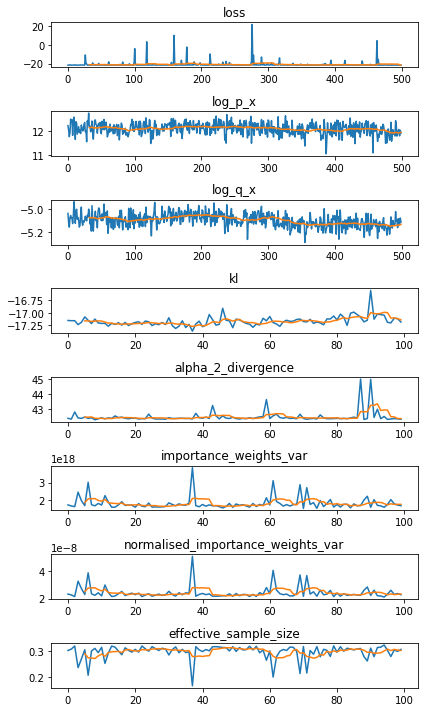

In [26]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")
plot_history(history)

loss: -21.58043288568822, mean log p_x 12.147091008839054:   0%|          | 0/2000 [00:00<?, ?it/s]

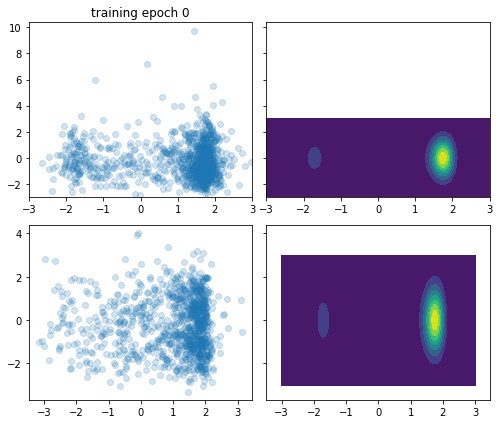

loss: 24.961832006208795, mean log p_x 12.033834144853298:   5%|▌         | 100/2000 [00:21<07:21,  4.30it/s] 

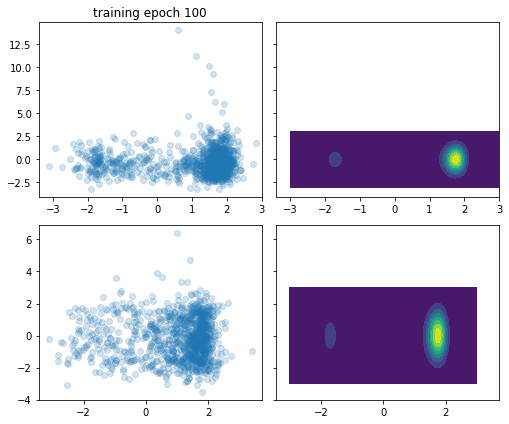

loss: -21.477643217348152, mean log p_x 11.727085189053646:  10%|█         | 200/2000 [00:42<06:10,  4.86it/s]

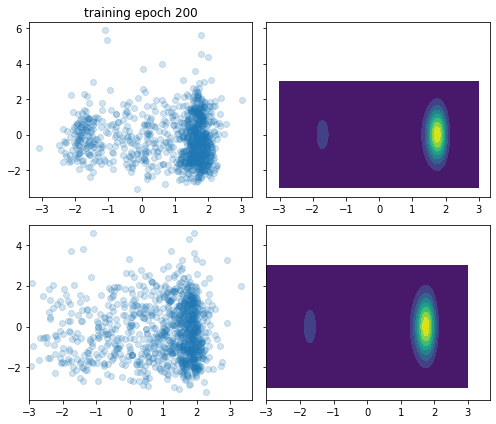

loss: -21.499249778565392, mean log p_x 11.883341589921395:  15%|█▌        | 300/2000 [01:03<05:37,  5.04it/s]

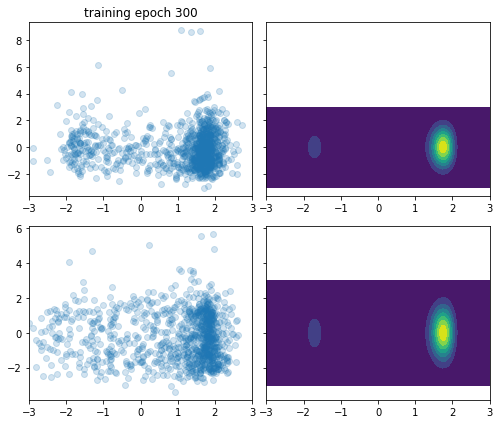

loss: -20.954846536998822, mean log p_x 12.196777013860626:  20%|██        | 400/2000 [01:24<05:15,  5.07it/s]

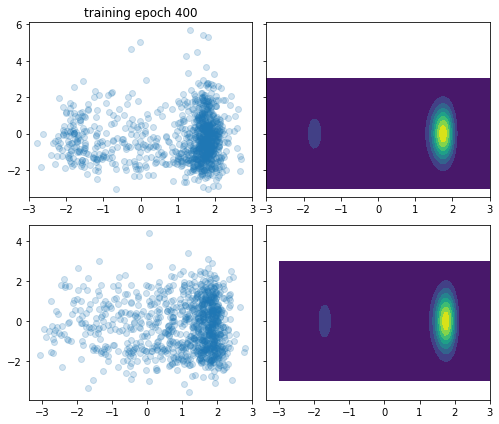

loss: -21.533187041196637, mean log p_x 12.297840479690121:  25%|██▌       | 500/2000 [01:45<04:47,  5.22it/s]

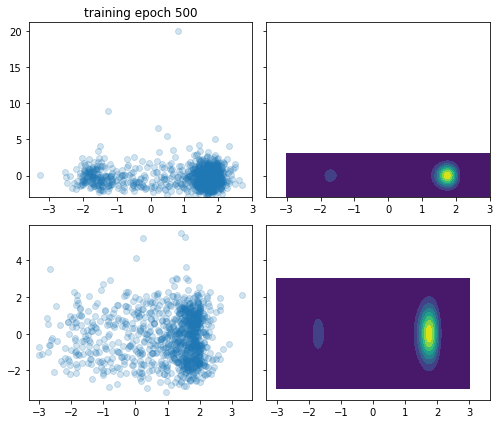

loss: -21.380249262668794, mean log p_x 11.93518899582282:  30%|███       | 600/2000 [02:06<04:39,  5.01it/s] 

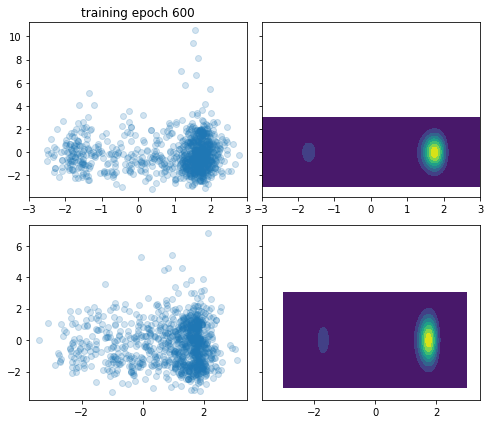

loss: -21.380249262668794, mean log p_x 11.93518899582282:  30%|███       | 607/2000 [02:08<04:55,  4.71it/s]


ValueError: The value argument must be within the support

In [27]:
history = tester.train(2000, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

loss: -21.467339291377712, mean log p_x 12.33444333581259:   0%|          | 0/500 [00:00<?, ?it/s]

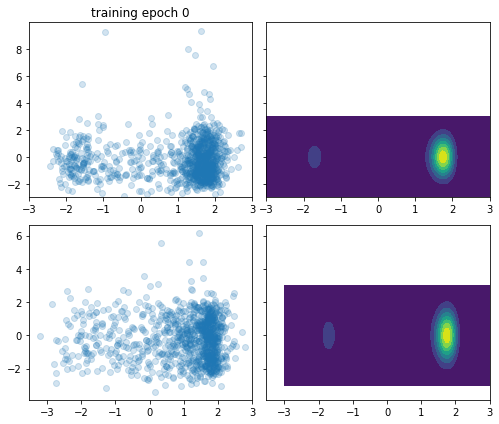

loss: -21.574503685251198, mean log p_x 12.195036347733511:   5%|▌         | 25/500 [00:06<01:46,  4.45it/s]

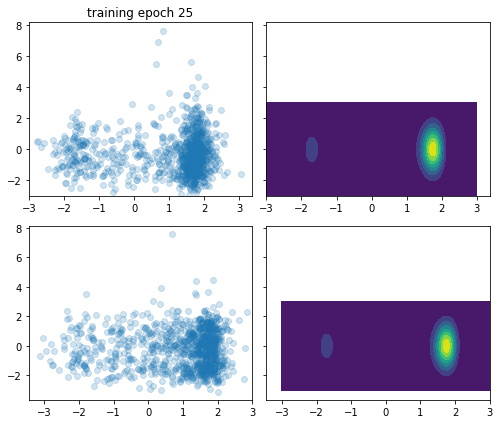

loss: -19.27691143049817, mean log p_x 12.188587112813028:  10%|█         | 50/500 [00:13<01:33,  4.82it/s] 

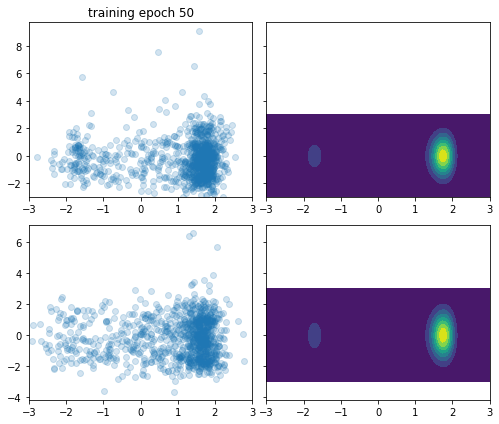

loss: -21.396441445836373, mean log p_x 12.208554795613269:  15%|█▌        | 75/500 [00:19<01:28,  4.82it/s]

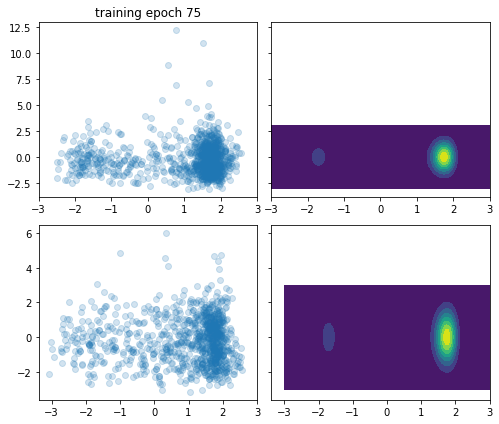

loss: -18.86527173979372, mean log p_x 12.490713612512042:  20%|██        | 100/500 [00:25<01:22,  4.84it/s]

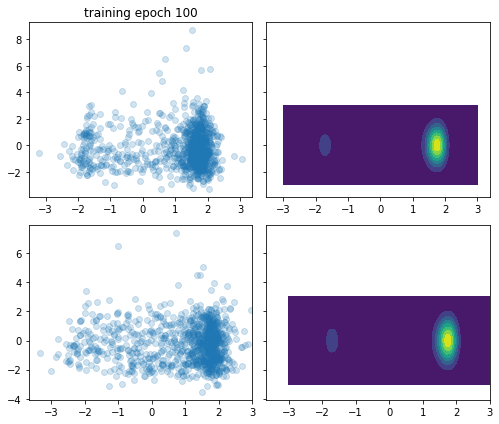

loss: -21.557084172868993, mean log p_x 11.782562520687634:  25%|██▌       | 125/500 [00:31<01:17,  4.81it/s]

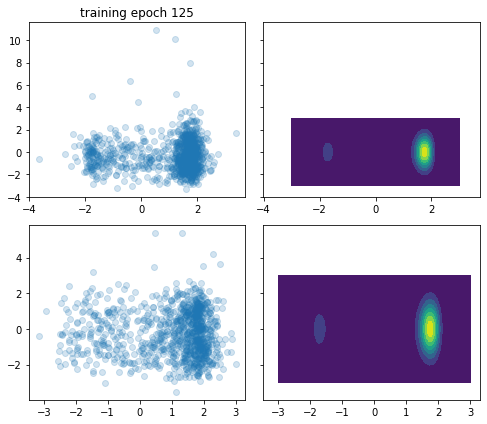

loss: -21.47109019668465, mean log p_x 2.8647926808019375:  30%|███       | 150/500 [00:38<01:14,  4.68it/s] 

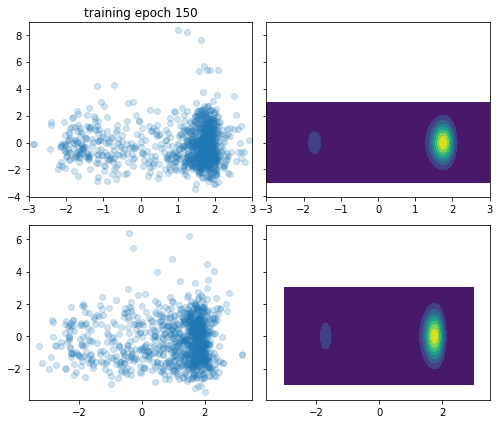

loss: -21.40798247772493, mean log p_x 12.195635540402469:  35%|███▌      | 175/500 [00:44<01:22,  3.92it/s] 

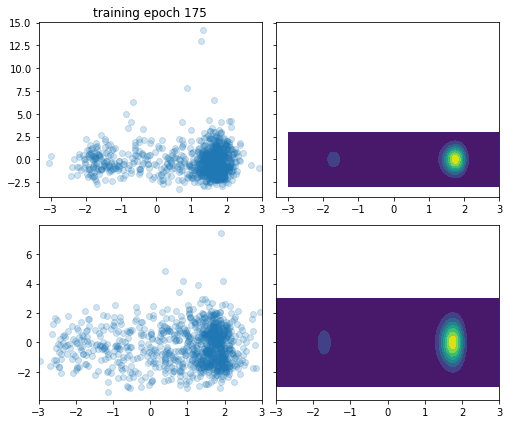

loss: -10.787649543674366, mean log p_x 12.385057767512048:  40%|████      | 200/500 [00:51<01:04,  4.64it/s]

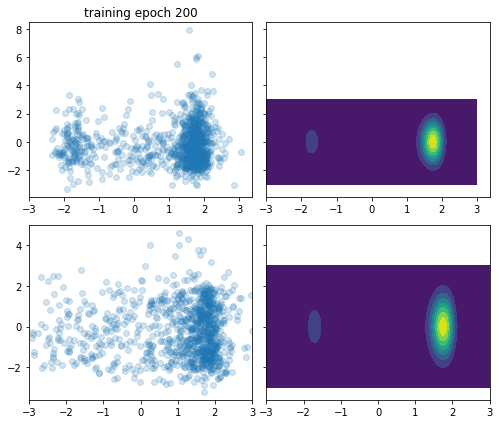

loss: -21.521306069329768, mean log p_x 11.961526042125135:  45%|████▌     | 225/500 [00:57<00:57,  4.75it/s]

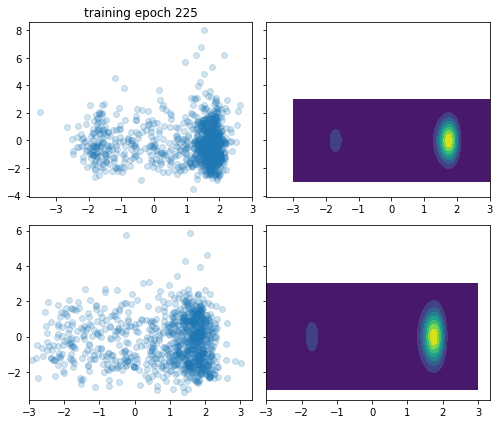

loss: -21.38112773493239, mean log p_x 12.137721449853743:  50%|█████     | 250/500 [01:03<00:53,  4.65it/s] 

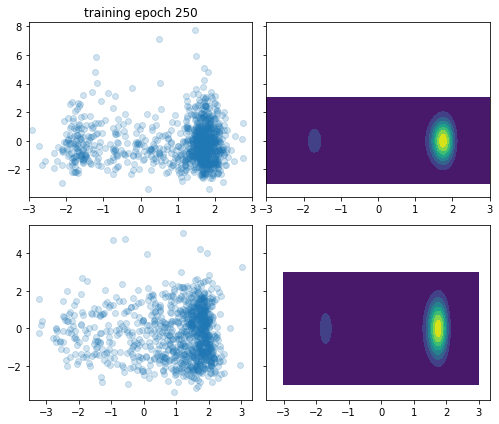

loss: -21.553913441804085, mean log p_x 11.808059123352136:  55%|█████▌    | 275/500 [01:09<00:50,  4.43it/s]

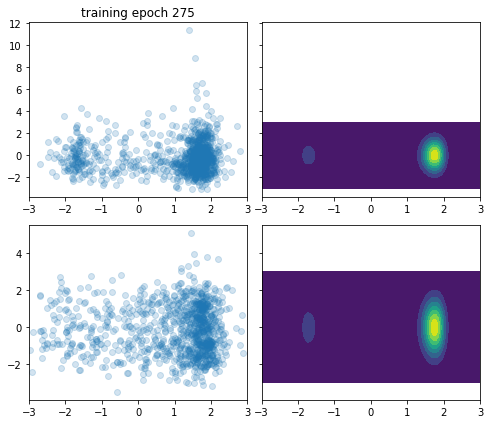

loss: -21.528150970719263, mean log p_x 12.143846891264843:  60%|██████    | 300/500 [01:16<00:43,  4.55it/s]

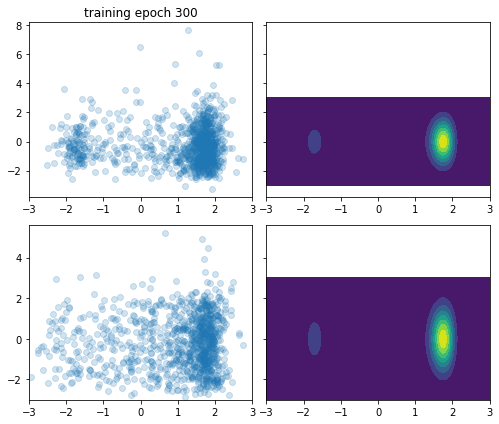

loss: -21.548828406563555, mean log p_x 12.124741650449346:  65%|██████▌   | 325/500 [01:22<00:37,  4.72it/s]

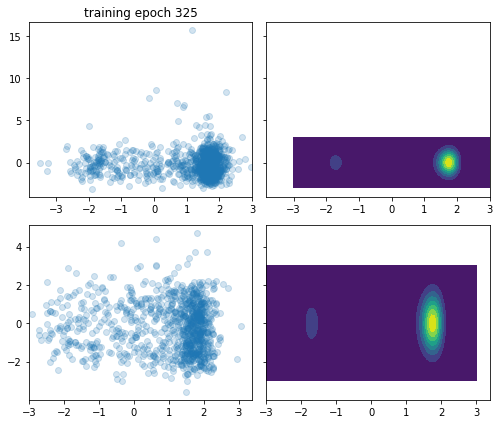

loss: -21.502122411935908, mean log p_x 12.265603735306723:  70%|███████   | 350/500 [01:28<00:31,  4.83it/s]

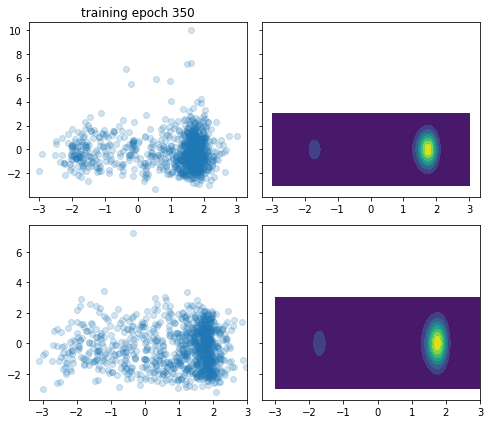

loss: -21.477382339160886, mean log p_x 12.323611067688667:  75%|███████▌  | 375/500 [01:34<00:25,  4.82it/s]

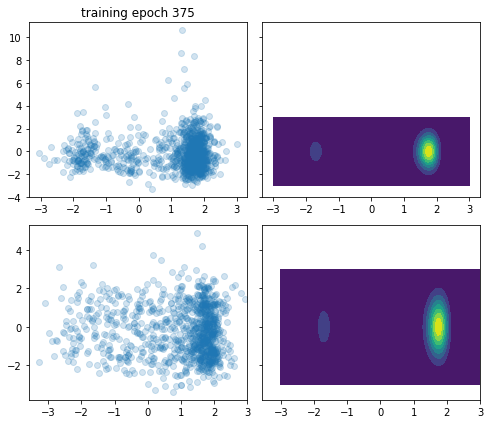

loss: -21.4842065917706, mean log p_x 12.60994911199064:  80%|████████  | 400/500 [01:41<00:20,  4.78it/s]   

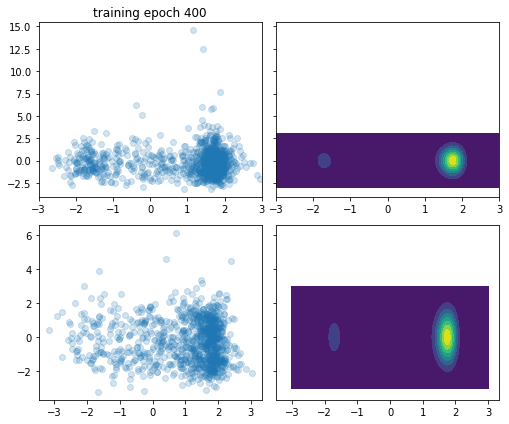

loss: -21.59513008661871, mean log p_x 12.316107420999522:  85%|████████▌ | 425/500 [01:47<00:15,  4.83it/s] 

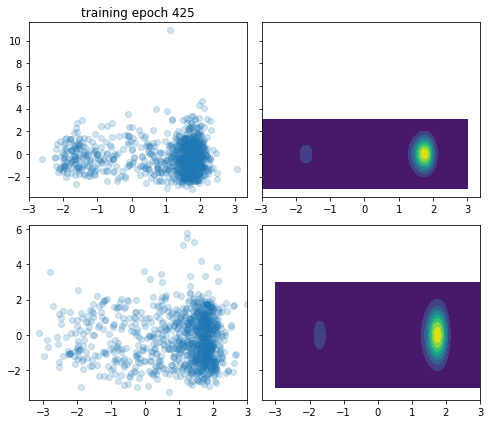

loss: -21.43150641507843, mean log p_x 12.616579644710386:  90%|█████████ | 450/500 [01:53<00:12,  4.13it/s] 

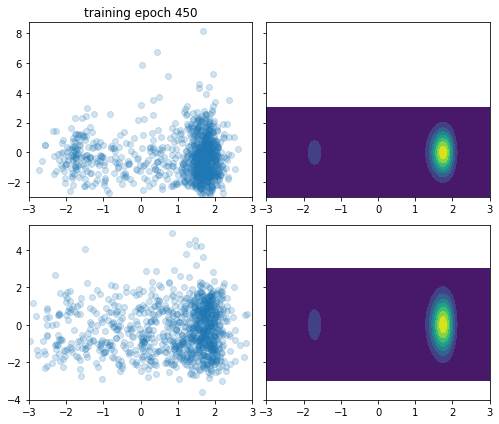

loss: -21.409482301482264, mean log p_x 11.918018419113523:  95%|█████████▌| 475/500 [01:59<00:05,  4.78it/s]

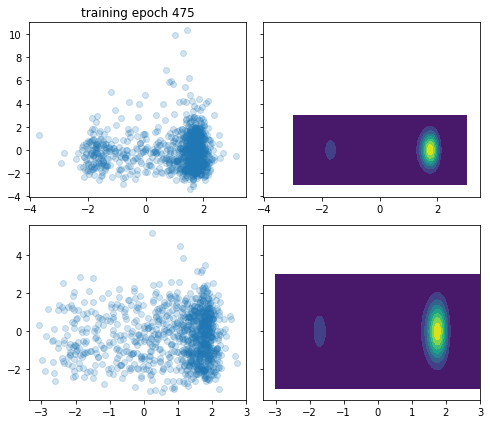

loss: -21.479613307550256, mean log p_x 12.434142401737681: 100%|██████████| 500/500 [02:05<00:00,  3.98it/s]


In [29]:
tester.learnt_sampling_dist.set_requires_grad(True)
history = tester.train(500, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

estimate before training is 23.45107589978393 
estimate after training is 23.445039591937697 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.27142285637644964
variance in weights is 2.6843149438282226e-10
estimate before training is 23.45107589978393 
estimate after training is 23.445039591937697 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.27142285637644964
variance in weights is 2.6843149438282226e-10
NaN encountered in kl history
NaN encountered in alpha_2_divergence history


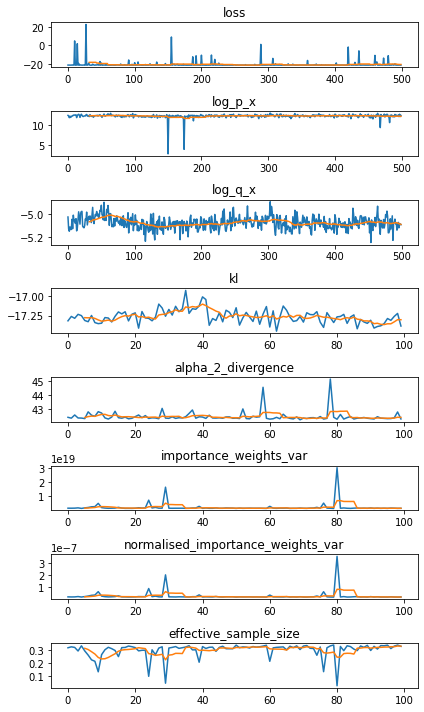

In [31]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")

expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")
plot_history(history)

loss: -21.57907498009503, mean log p_x 12.285817015429348:   0%|          | 0/500 [00:00<?, ?it/s]

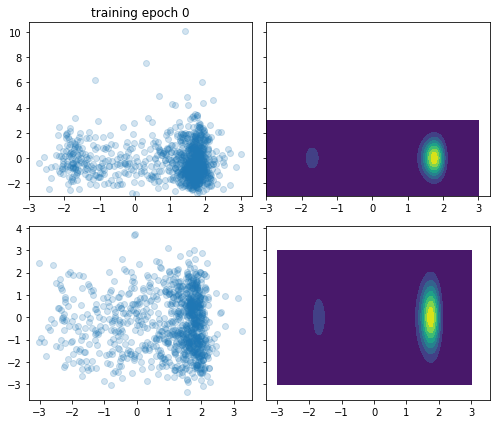

loss: -21.58868466826388, mean log p_x 12.3835331676594:   5%|▌         | 25/500 [00:06<01:38,  4.81it/s]   

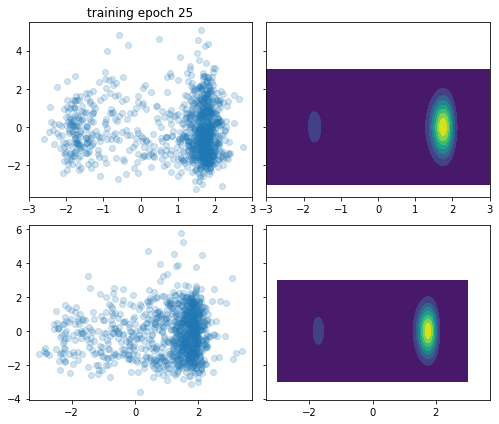

loss: -21.503362822627096, mean log p_x 11.997165667276535:  10%|█         | 50/500 [00:12<01:33,  4.82it/s]

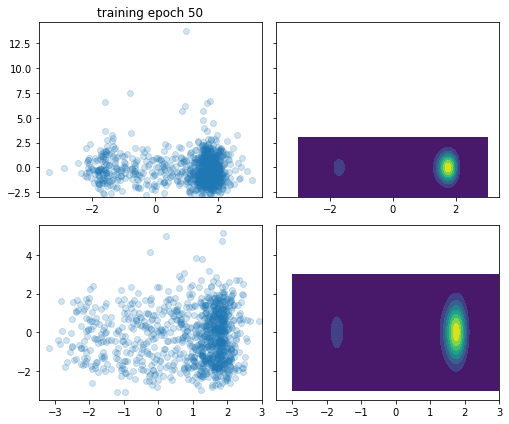

loss: -21.537268703046895, mean log p_x 12.091192452485627:  15%|█▌        | 75/500 [00:18<01:34,  4.49it/s]

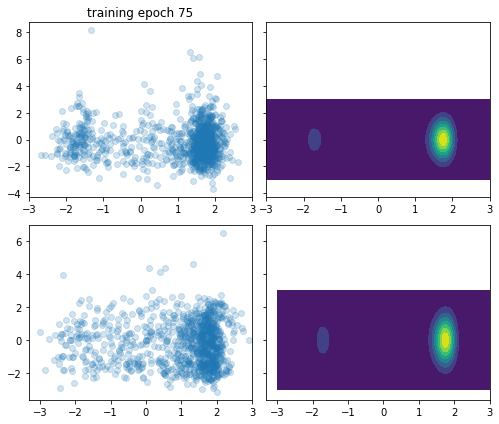

loss: -13.450774469576633, mean log p_x 12.089639425219747:  20%|██        | 100/500 [00:24<01:24,  4.73it/s]

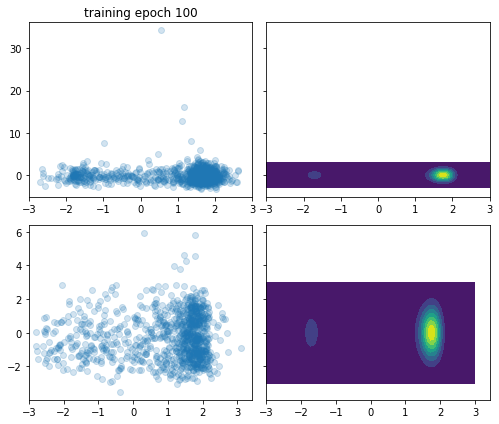

loss: -21.529199517056355, mean log p_x 11.791938010798068:  25%|██▌       | 125/500 [00:30<01:17,  4.82it/s]

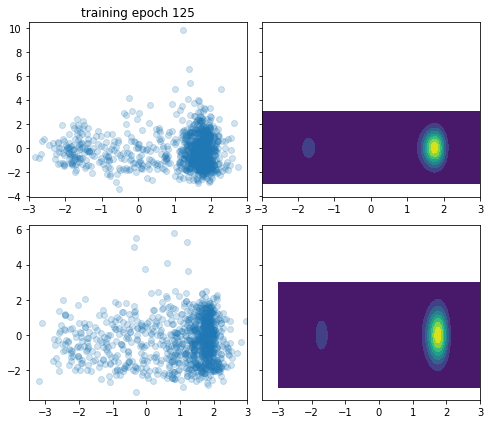

loss: -21.54437655257316, mean log p_x 12.450592524205979:  30%|███       | 150/500 [00:37<01:20,  4.32it/s] 

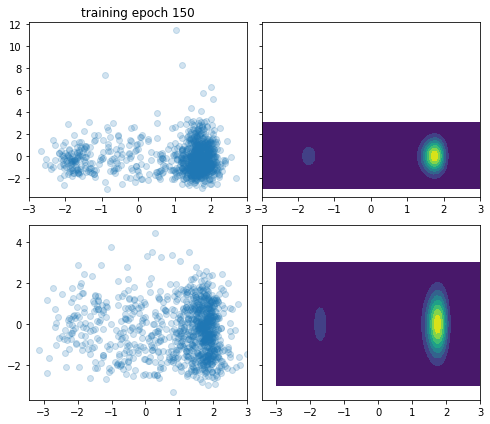

loss: -21.501250614102663, mean log p_x 12.63125530722684:  35%|███▌      | 175/500 [00:43<01:11,  4.54it/s] 

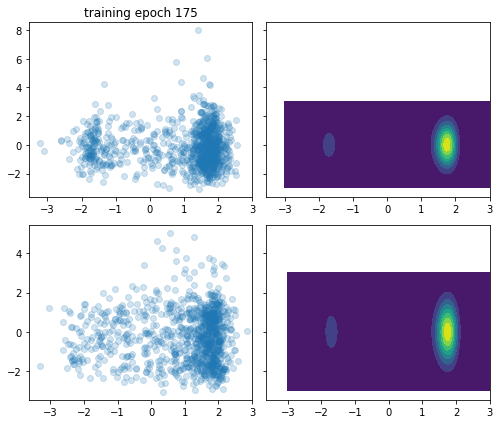

loss: -21.47308086717746, mean log p_x 12.369967798394814:  40%|████      | 200/500 [00:49<01:02,  4.82it/s] 

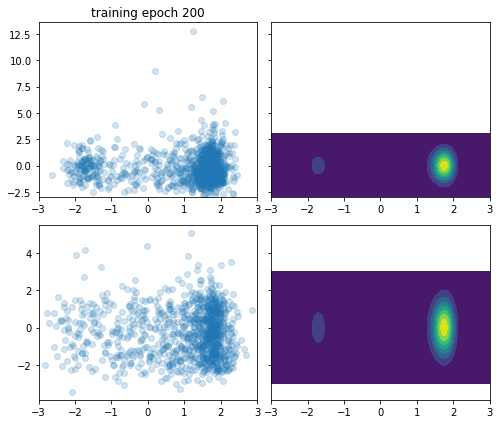

loss: -21.411191227792116, mean log p_x 12.096280281235254:  45%|████▌     | 225/500 [00:56<00:57,  4.75it/s]

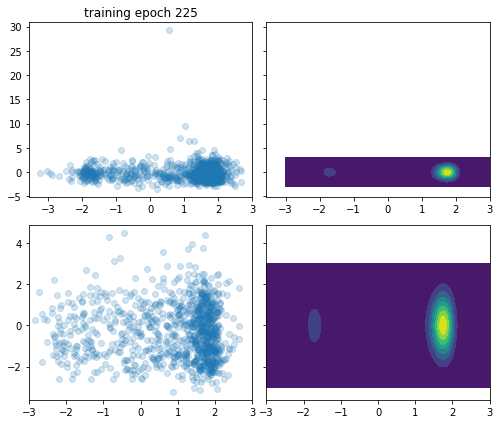

loss: -21.4984991824054, mean log p_x 12.547090652058367:  50%|█████     | 250/500 [01:02<00:54,  4.55it/s]  

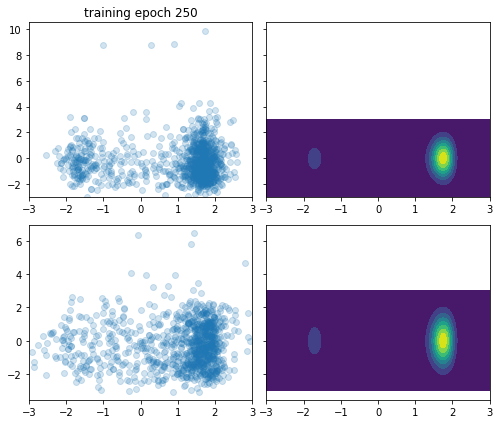

loss: -19.550777200743127, mean log p_x 11.576955939696502:  55%|█████▌    | 275/500 [01:08<00:51,  4.38it/s]

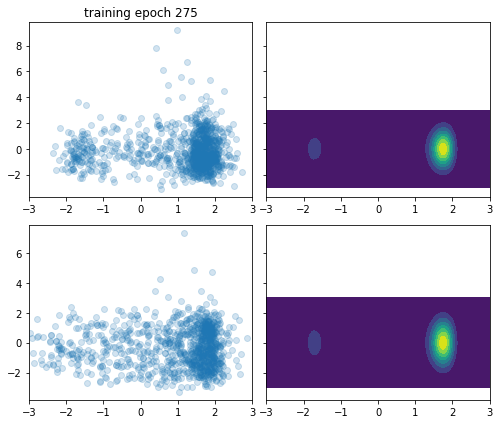

loss: -21.24917775893166, mean log p_x 12.704988305068747:  60%|██████    | 300/500 [01:14<00:42,  4.73it/s] 

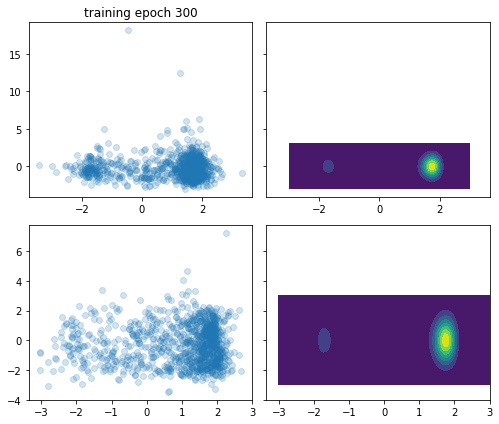

loss: -21.43970015376498, mean log p_x 12.458855311004587:  65%|██████▌   | 325/500 [01:21<00:39,  4.47it/s] 

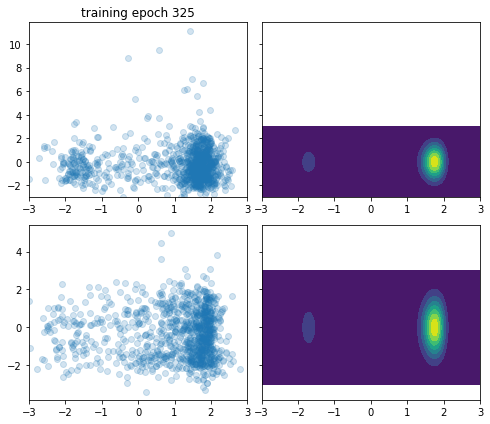

loss: -21.40320028518456, mean log p_x 11.919750270787183:  70%|███████   | 350/500 [01:27<00:31,  4.77it/s] 

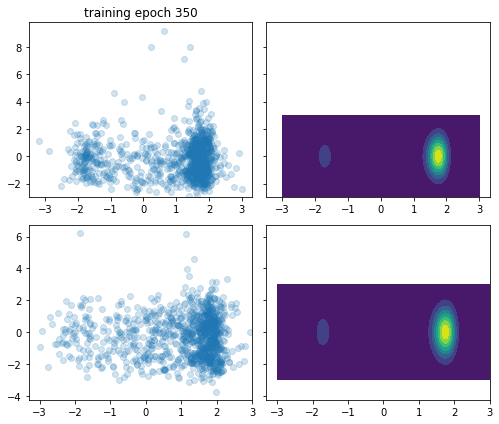

loss: -21.4977494250852, mean log p_x 12.209326967175995:  75%|███████▌  | 375/500 [01:33<00:26,  4.65it/s]  

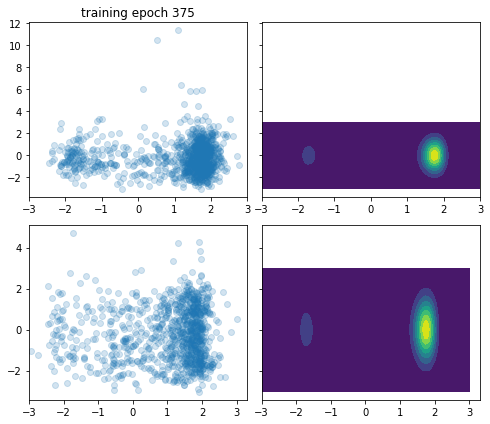

loss: -21.419832865249024, mean log p_x 12.646351811610753:  80%|████████  | 400/500 [01:39<00:21,  4.69it/s]

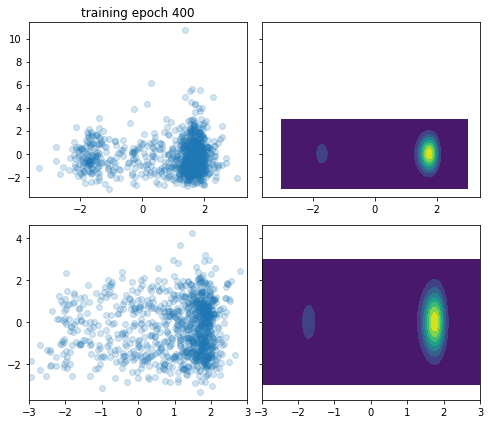

loss: -21.41857124113443, mean log p_x 12.500891241261165:  85%|████████▌ | 425/500 [01:45<00:14,  5.30it/s] 

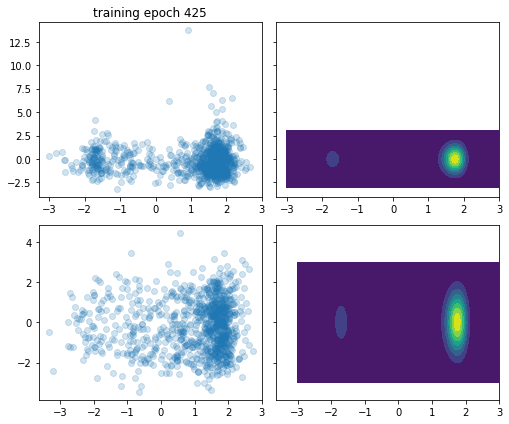

loss: -21.367251709134244, mean log p_x 12.70833795027902:  90%|█████████ | 450/500 [01:51<00:10,  4.67it/s]

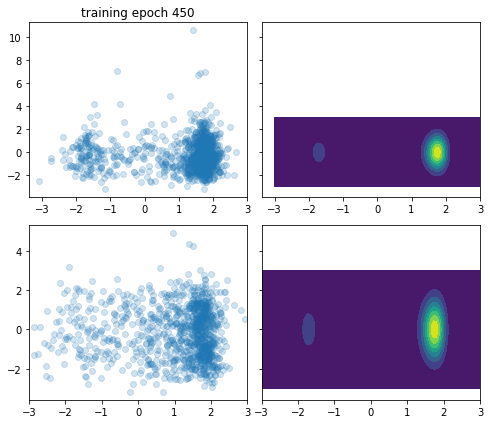

loss: -21.408913724828867, mean log p_x 12.207085171463675:  95%|█████████▌| 475/500 [01:57<00:04,  5.21it/s]

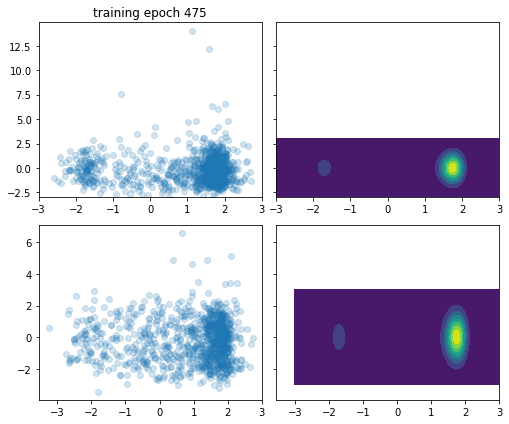

loss: -21.484682485375615, mean log p_x 12.31924964913815: 100%|██████████| 500/500 [02:03<00:00,  4.06it/s] 


In [32]:
history = tester.train(500, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

estimate before training is 23.45107589978393 
estimate after training is 23.443526962610665 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.2872057795580374
variance in weights is 2.4818489013428784e-10
estimate before training is 23.45107589978393 
estimate after training is 23.443526962610665 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.2872057795580374
variance in weights is 2.4818489013428784e-10


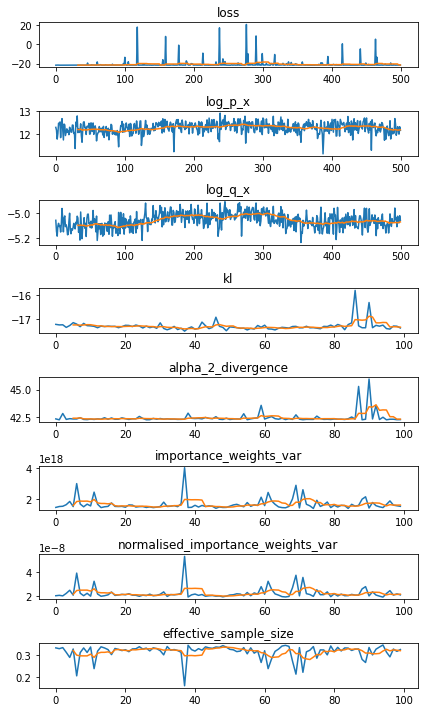

In [33]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")

expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")
plot_history(history)

loss: -21.557826121597895, mean log p_x 12.34124338906294:   0%|          | 0/1000 [00:00<?, ?it/s]

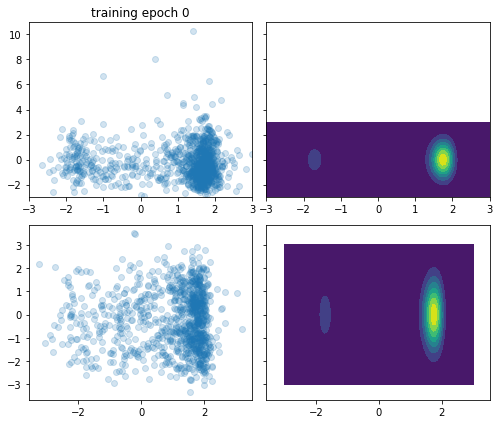

loss: -21.591893258568533, mean log p_x 12.679407460343763:   5%|▌         | 50/1000 [00:11<02:57,  5.36it/s]

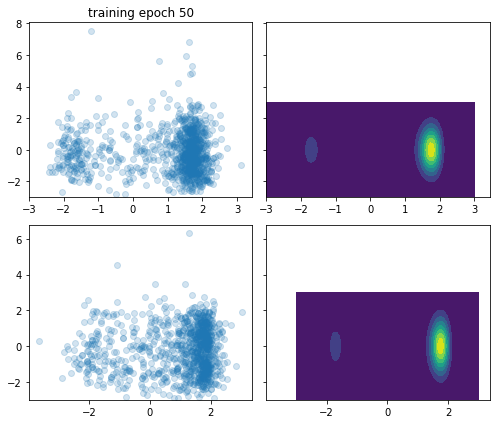

loss: -21.598226618516783, mean log p_x 12.516603355213524:  10%|█         | 100/1000 [00:21<02:45,  5.43it/s]

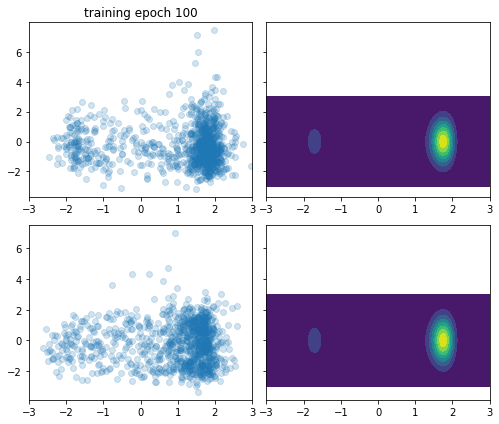

loss: -21.501199817137614, mean log p_x 12.389902037937105:  15%|█▌        | 150/1000 [00:31<02:36,  5.42it/s]

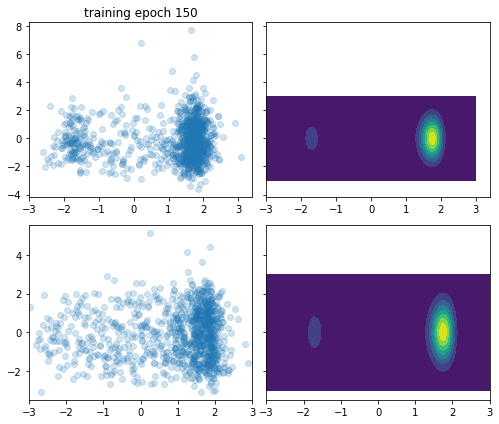

loss: -21.484158920697887, mean log p_x 12.048709248235879:  20%|██        | 200/1000 [00:41<02:29,  5.36it/s]

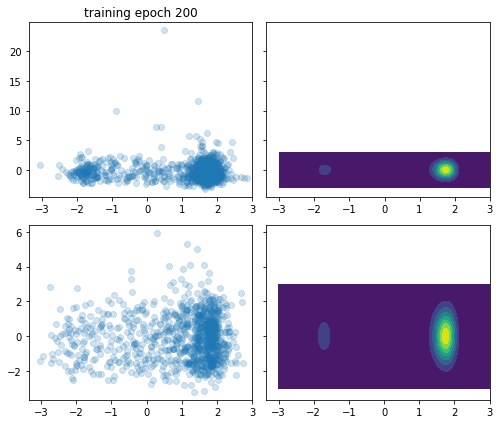

loss: -21.48649474467313, mean log p_x 12.371706804152746:  25%|██▌       | 250/1000 [00:52<02:18,  5.41it/s] 

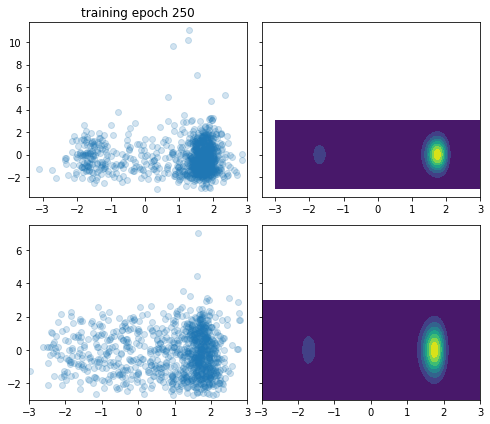

loss: -21.482241335357564, mean log p_x 12.877579742476026:  30%|███       | 300/1000 [01:02<02:09,  5.41it/s]

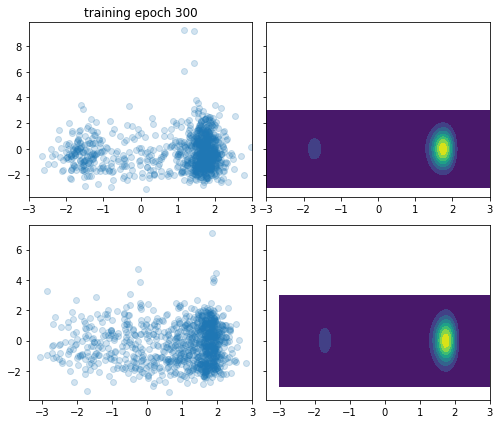

loss: -21.525599787423364, mean log p_x 12.502312549854386:  35%|███▌      | 350/1000 [01:13<02:10,  4.99it/s]

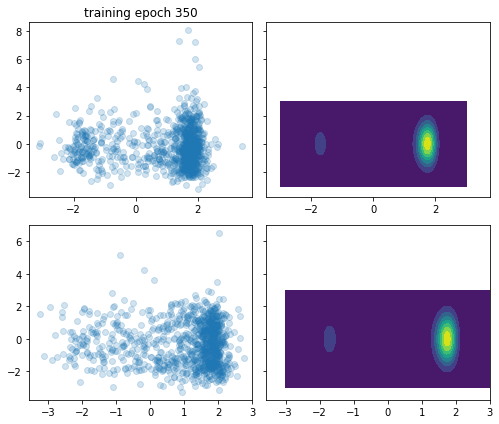

loss: -21.111761767880026, mean log p_x 12.416028409353075:  40%|████      | 400/1000 [01:23<01:51,  5.36it/s]

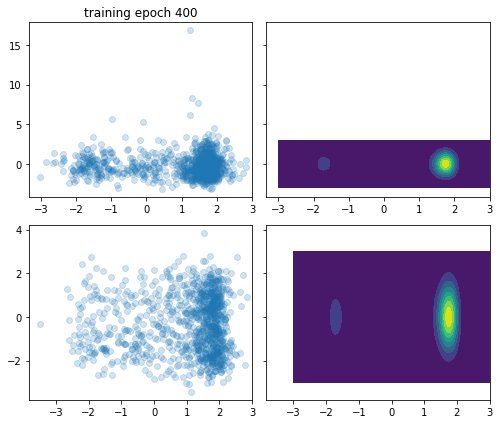

loss: -21.491288249557247, mean log p_x 12.633872782422717:  45%|████▌     | 450/1000 [01:34<01:44,  5.26it/s]

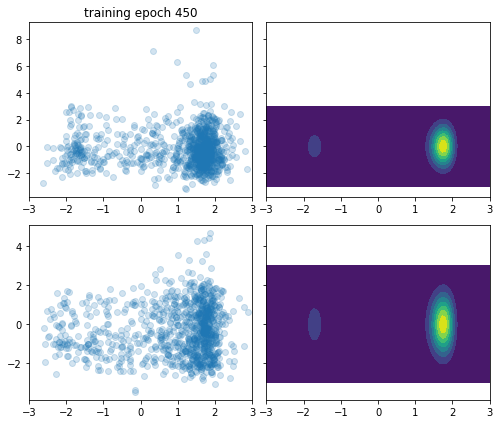

loss: -21.45623753878844, mean log p_x 12.505595593808879:  50%|█████     | 500/1000 [01:45<01:41,  4.91it/s] 

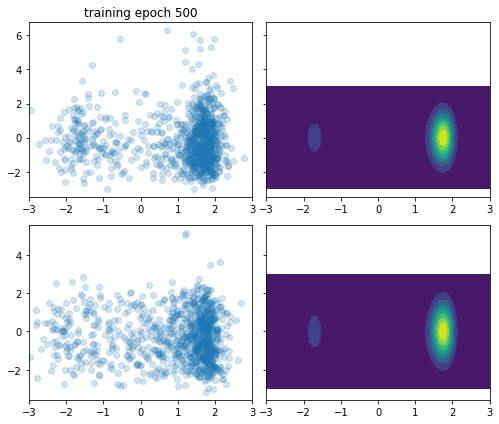

loss: -21.25007445763591, mean log p_x 12.16741719305688:  53%|█████▎    | 534/1000 [01:52<01:38,  4.74it/s]  


ValueError: The value argument must be within the support

In [34]:
history = tester.train(1000, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

loss: -21.50749893650279, mean log p_x 12.541839604372989:   0%|          | 0/500 [00:00<?, ?it/s]

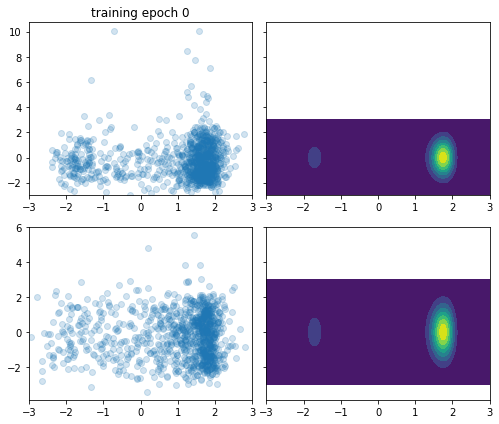

loss: -21.52035315368822, mean log p_x 12.369904355005515:   5%|▌         | 25/500 [00:06<01:49,  4.34it/s] 

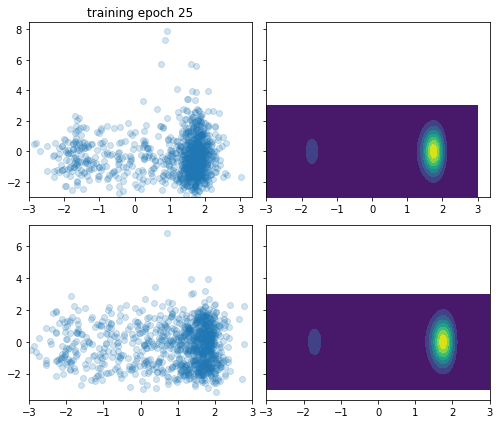

loss: -20.516000031648538, mean log p_x 12.38673219290716:  10%|█         | 50/500 [00:12<01:36,  4.66it/s] 

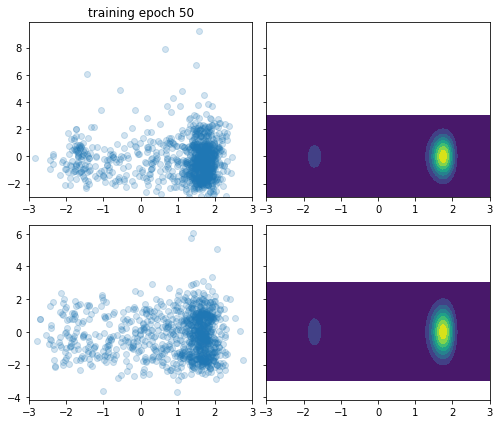

loss: -21.402051144473216, mean log p_x 12.45638122085174:  15%|█▌        | 75/500 [00:19<01:34,  4.48it/s] 

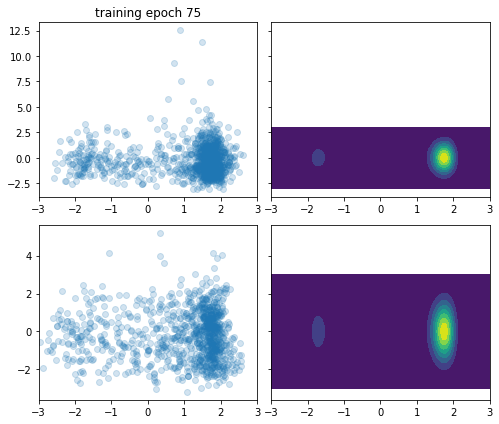

loss: -21.4864150396217, mean log p_x 12.768097321011581:  20%|██        | 100/500 [00:25<01:17,  5.18it/s]  

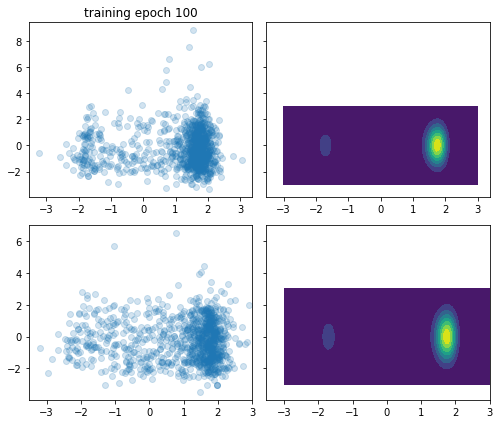

loss: -21.546033672966438, mean log p_x 12.076768600783165:  25%|██▌       | 125/500 [00:30<01:12,  5.19it/s]

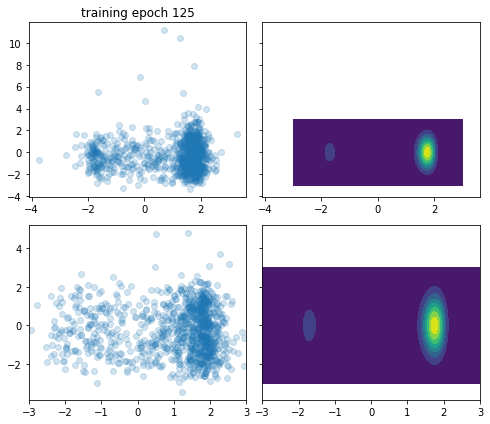

loss: -21.422296494472455, mean log p_x 5.789065247240126:  30%|███       | 150/500 [00:36<01:08,  5.11it/s] 

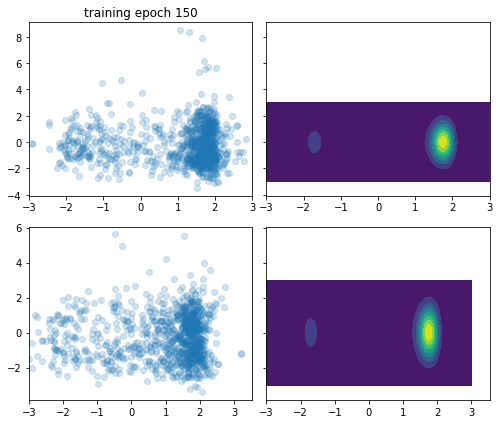

loss: -21.49160019571223, mean log p_x 12.436667207806503:  35%|███▌      | 175/500 [00:42<01:02,  5.20it/s] 

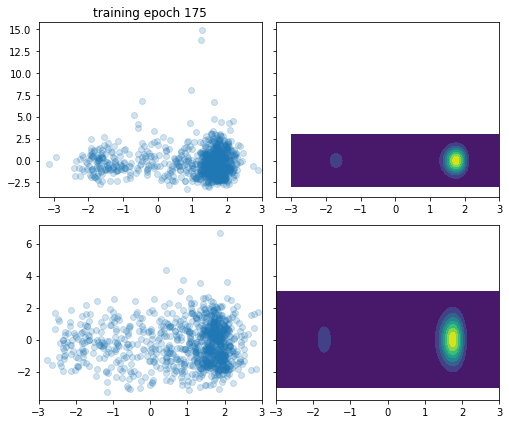

loss: -12.577924762679649, mean log p_x 12.623416854120164:  40%|████      | 200/500 [00:47<00:58,  5.14it/s]

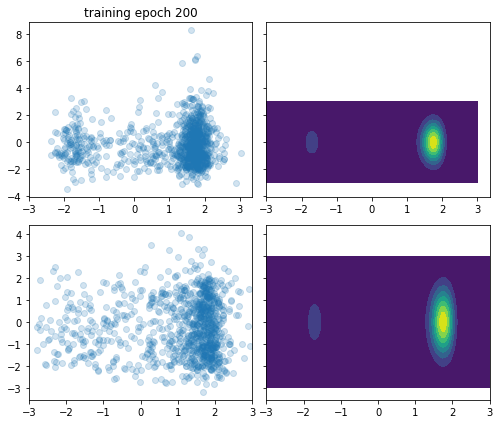

loss: -21.412444626030947, mean log p_x 12.195519145625422:  45%|████▌     | 225/500 [00:53<00:52,  5.22it/s]

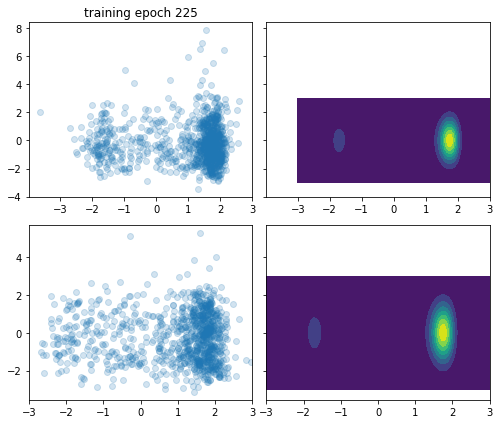

loss: -21.38097584661982, mean log p_x 12.38310911407981:  50%|█████     | 250/500 [00:59<00:47,  5.22it/s]  

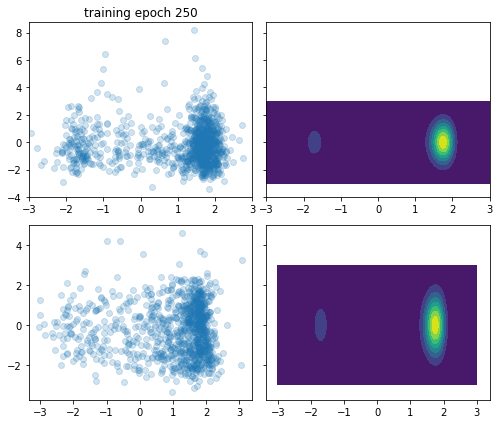

loss: -21.514354628990475, mean log p_x 12.014584318950883:  55%|█████▌    | 275/500 [01:04<00:43,  5.14it/s]

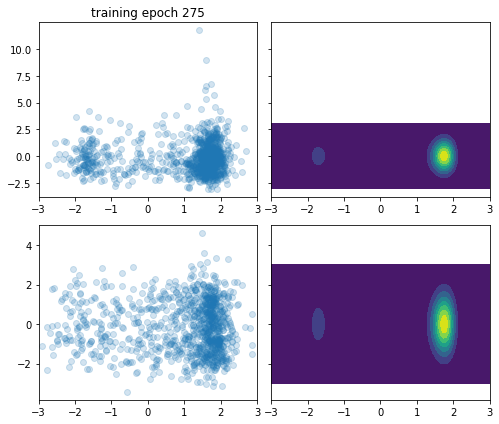

loss: -21.499798660706677, mean log p_x 12.371410092196761:  60%|██████    | 300/500 [01:10<00:38,  5.19it/s]

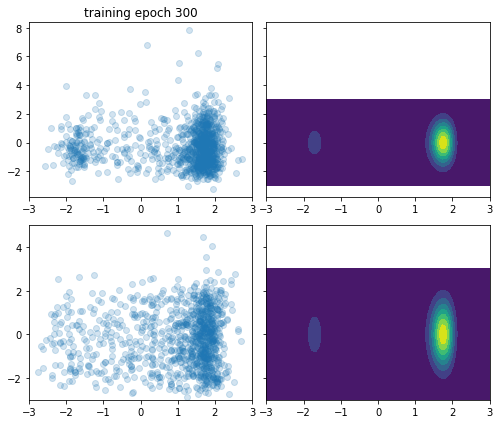

loss: -21.50475241949101, mean log p_x 12.352737887426025:  65%|██████▌   | 325/500 [01:16<00:35,  5.00it/s] 

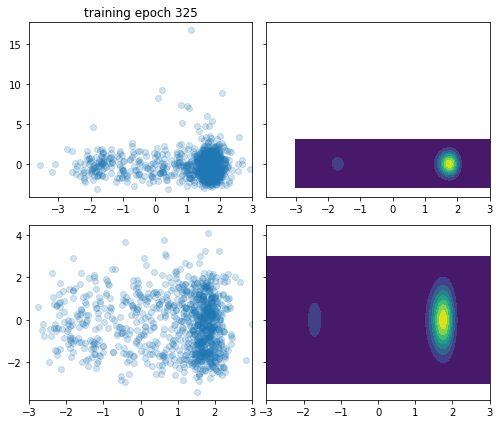

loss: -21.482546429511743, mean log p_x 12.538253596487474:  70%|███████   | 350/500 [01:21<00:28,  5.18it/s]

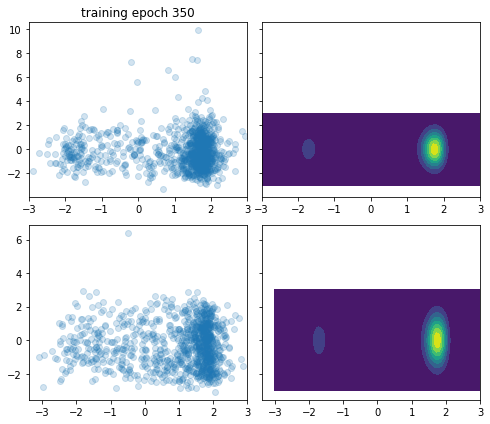

loss: -21.49878527299556, mean log p_x 12.55038580801112:  75%|███████▌  | 375/500 [01:27<00:26,  4.80it/s]  

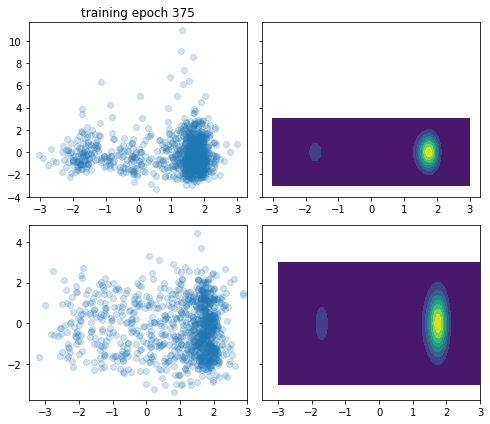

loss: -21.502916383326053, mean log p_x 12.806541249169351:  80%|████████  | 400/500 [01:33<00:19,  5.15it/s]

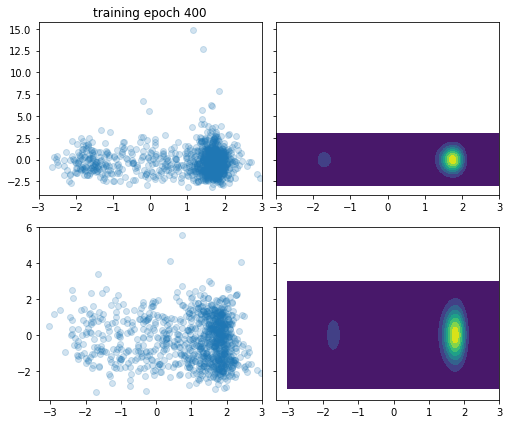

loss: -21.55779390355655, mean log p_x 12.541334536379129:  85%|████████▌ | 425/500 [01:39<00:14,  5.13it/s] 

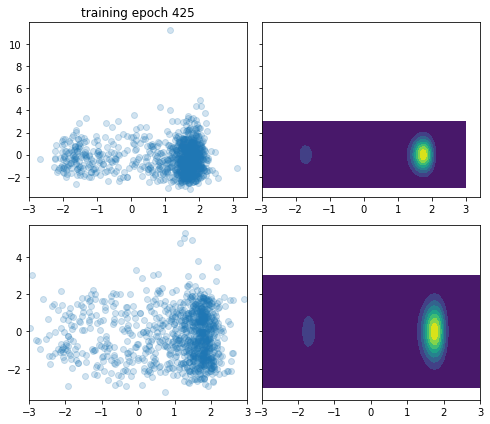

loss: -21.482573539867467, mean log p_x 12.823234856476748:  90%|█████████ | 450/500 [01:44<00:09,  5.11it/s]

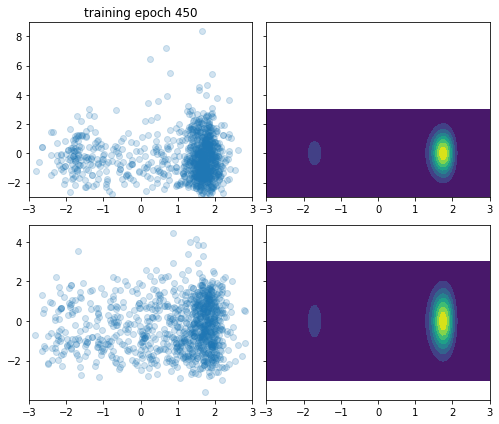

loss: -21.434929195138483, mean log p_x 12.097864253027128:  95%|█████████▌| 475/500 [01:50<00:04,  5.18it/s]

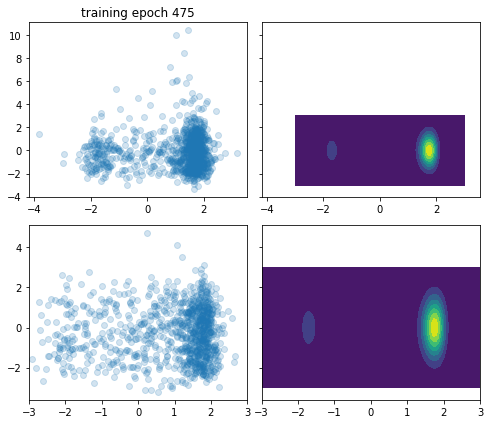

loss: -21.44961663547931, mean log p_x 12.631426147961648: 100%|██████████| 500/500 [01:56<00:00,  4.31it/s] 


In [36]:
tester.learnt_sampling_dist.set_requires_grad(True)
history = tester.train(500, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

estimate before training is 23.45107589978393 
estimate after training is 23.41803603020365 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.30857271037748657
variance in weights is 2.2407496862529057e-10
NaN encountered in alpha_2_divergence history


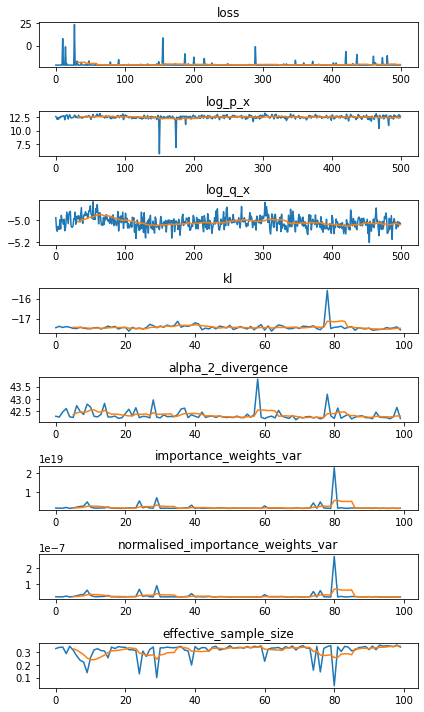

In [38]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")
plot_history(history)

loss: -21.539545374787792, mean log p_x 12.52499030669585:   0%|          | 0/1000 [00:00<?, ?it/s]

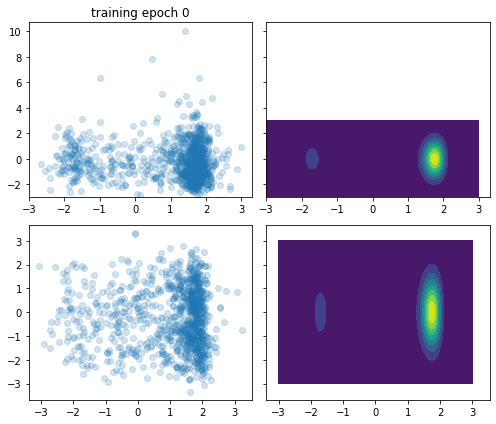

loss: -21.440047558107246, mean log p_x 12.884115484806646:   5%|▌         | 50/1000 [00:10<03:00,  5.27it/s]

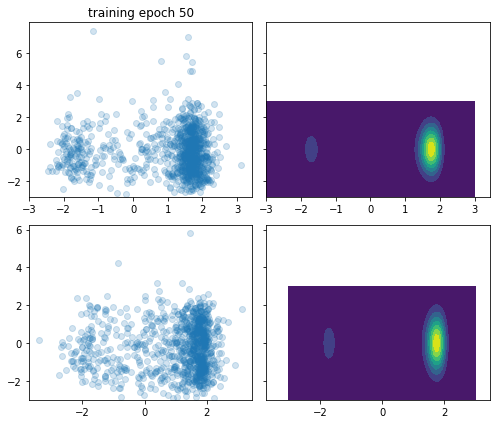

loss: -21.549313474548704, mean log p_x 12.732493777932216:  10%|█         | 100/1000 [00:21<02:47,  5.38it/s]

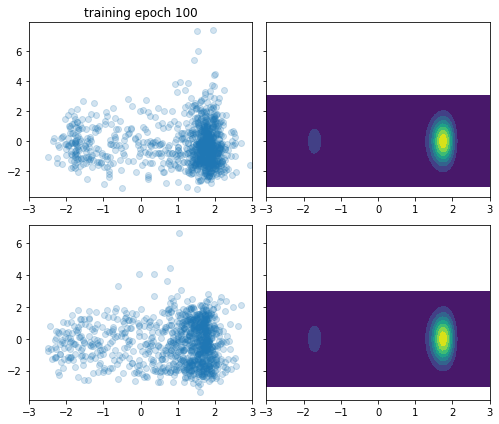

loss: -21.43244272447108, mean log p_x 12.60510002890136:  15%|█▌        | 150/1000 [00:31<02:34,  5.50it/s]  

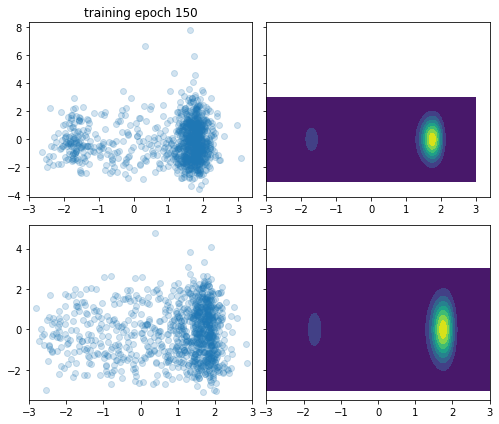

loss: -21.464938609060066, mean log p_x 12.247789651144547:  20%|██        | 200/1000 [00:41<02:28,  5.40it/s]

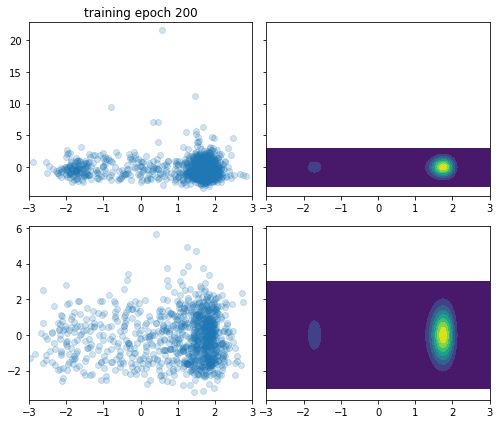

loss: -21.448172546978405, mean log p_x 12.511276748850499:  25%|██▌       | 250/1000 [00:51<02:17,  5.44it/s]

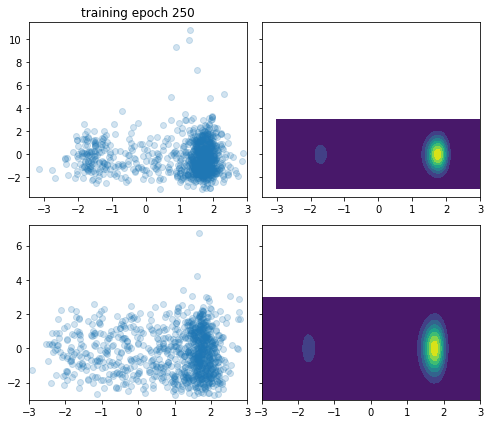

loss: -21.470216917300938, mean log p_x 12.977615130763859:  30%|███       | 300/1000 [01:01<02:08,  5.43it/s]

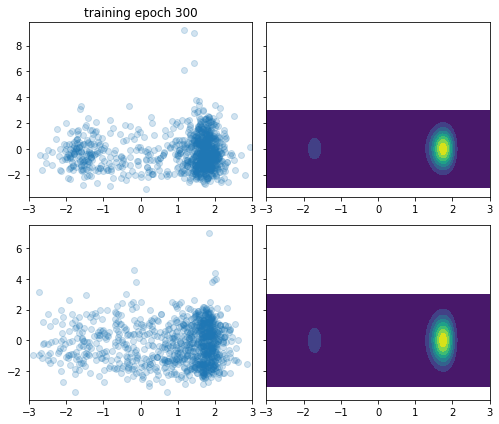

loss: -21.51560124313524, mean log p_x 12.702304713549802:  35%|███▌      | 350/1000 [01:12<01:59,  5.44it/s] 

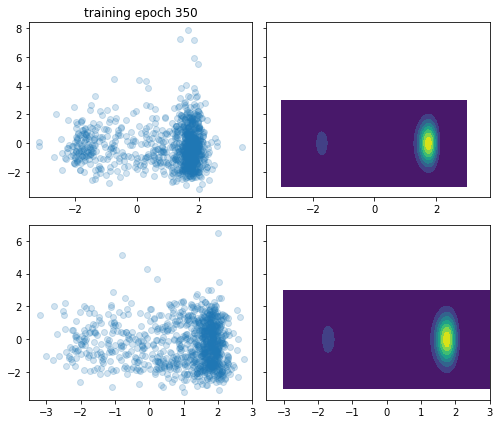

loss: -20.840431653947753, mean log p_x 12.705471256822458:  40%|████      | 400/1000 [01:22<01:53,  5.29it/s]

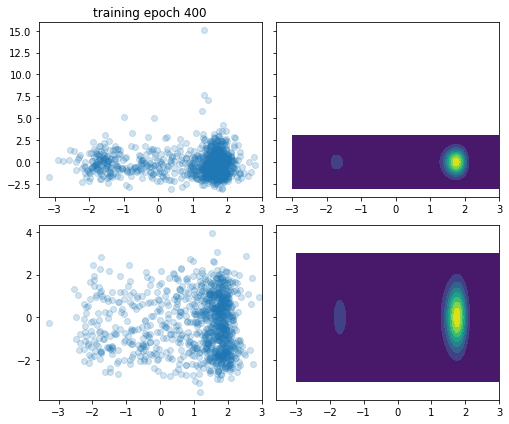

loss: -21.242423304280017, mean log p_x 12.806539088805556:  45%|████▌     | 450/1000 [01:33<01:50,  4.96it/s]

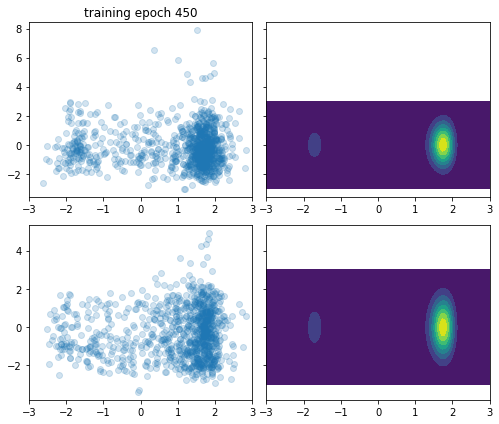

loss: -21.380685243442816, mean log p_x 12.699339756123774:  50%|█████     | 500/1000 [01:45<01:35,  5.23it/s]

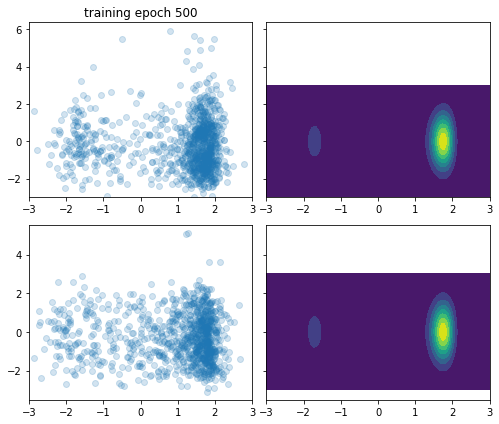

loss: 12.493614181926969, mean log p_x 12.794757953859268:  55%|█████▌    | 550/1000 [01:56<01:27,  5.15it/s] 

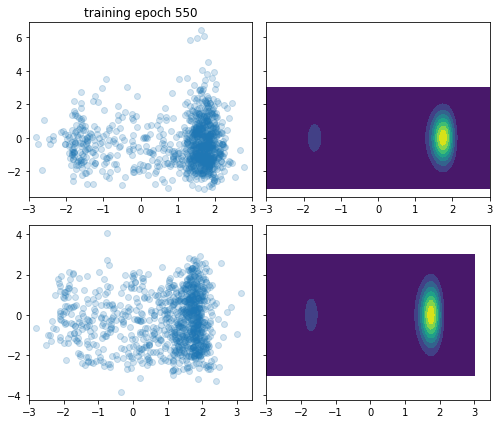

loss: -21.449765794599692, mean log p_x 12.447423805343591:  60%|██████    | 600/1000 [02:06<01:13,  5.46it/s]

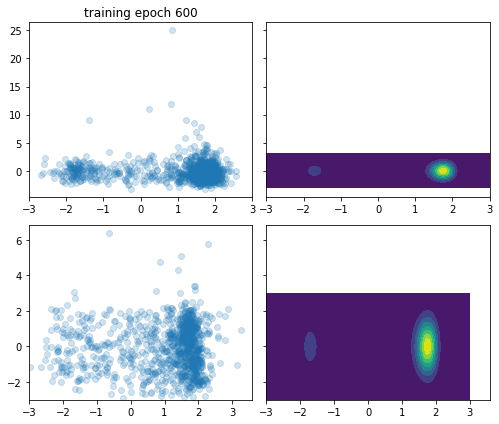

loss: -21.374375123335014, mean log p_x 12.55273889958101:  65%|██████▌   | 650/1000 [02:18<01:16,  4.55it/s] 

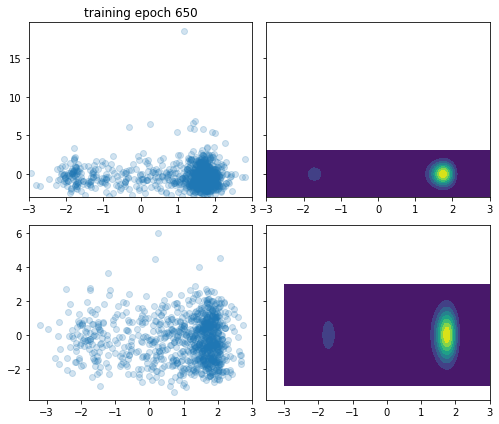

loss: -21.523161194481943, mean log p_x 12.579620440994049:  70%|███████   | 700/1000 [02:29<01:03,  4.70it/s]

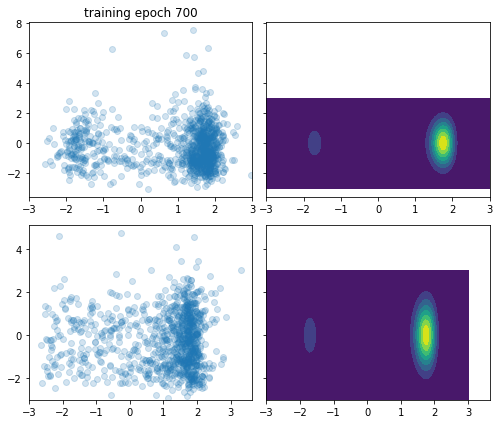

loss: -21.426139946022598, mean log p_x 12.002439277451849:  75%|███████▌  | 750/1000 [02:40<00:46,  5.34it/s]

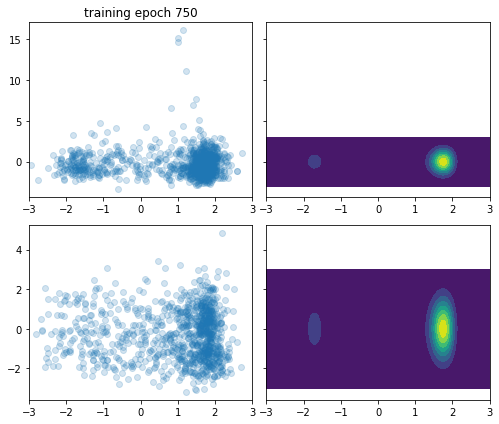

loss: -18.610390961868553, mean log p_x 12.567884052303407:  80%|████████  | 800/1000 [02:50<00:38,  5.18it/s]

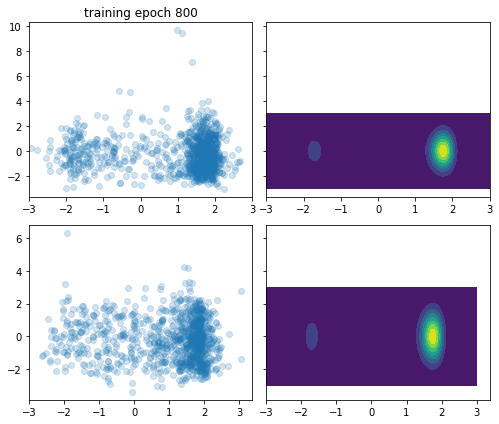

loss: -21.44665695278416, mean log p_x 12.566851251956301:  85%|████████▌ | 850/1000 [03:01<00:29,  5.03it/s] 

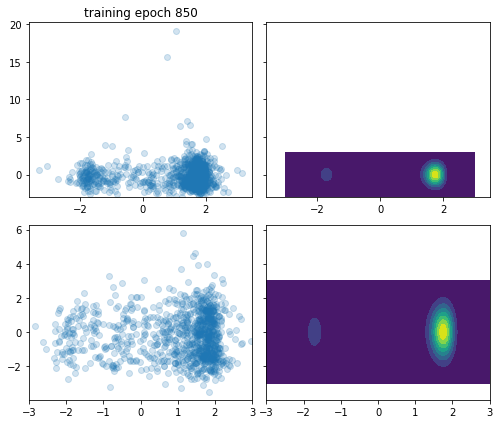

loss: -21.47636612701158, mean log p_x 12.746452446335715:  90%|█████████ | 900/1000 [03:12<00:19,  5.07it/s] 

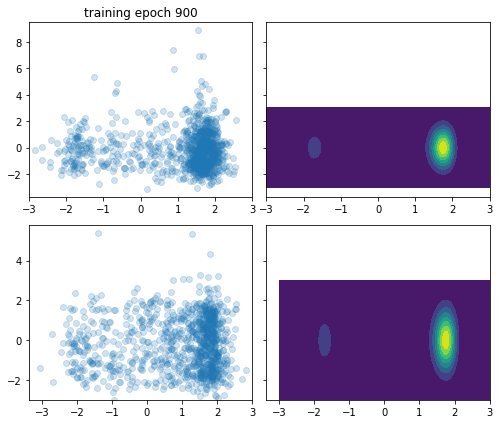

loss: -21.410936556584893, mean log p_x 12.47409499621502:  95%|█████████▌| 950/1000 [03:22<00:09,  5.17it/s] 

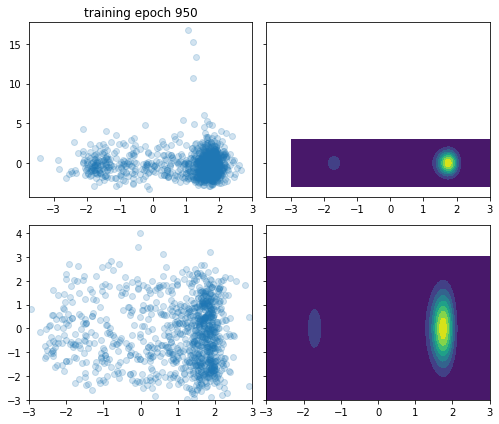

loss: -21.416359240170816, mean log p_x 12.297736677840676: 100%|██████████| 1000/1000 [03:33<00:00,  4.69it/s]


In [39]:
tester.learnt_sampling_dist.set_requires_grad(True)
history = tester.train(1000, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

estimate before training is 23.45107589978393 
estimate after training is 23.413556873695985 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.29797055558121194
variance in weights is 2.3560598577066306e-10


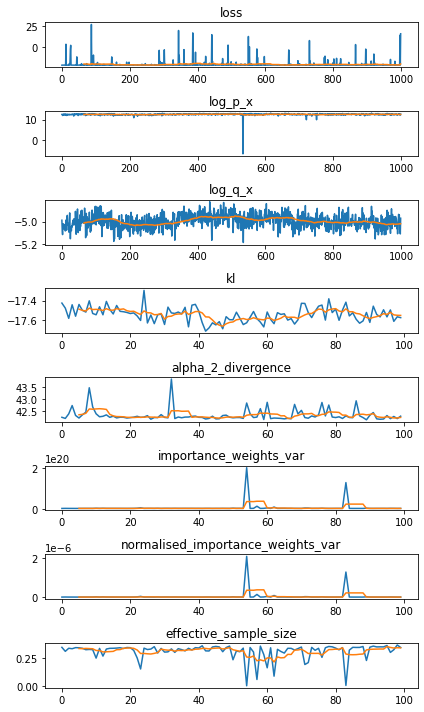

In [40]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")
plot_history(history)

loss: -21.50003490589761, mean log p_x 12.648911882001808:   0%|          | 0/2000 [00:00<?, ?it/s]

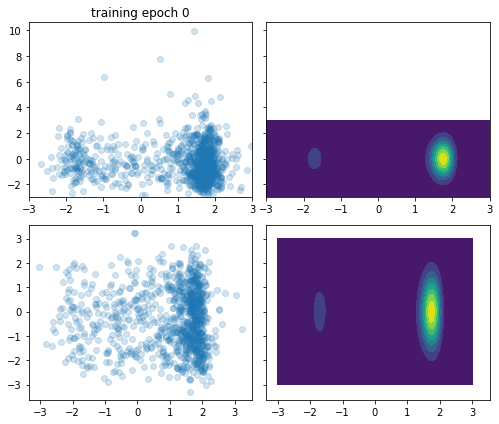

loss: 26.999999364083642, mean log p_x 12.511839512971164:   5%|▌         | 100/2000 [00:19<05:49,  5.43it/s]

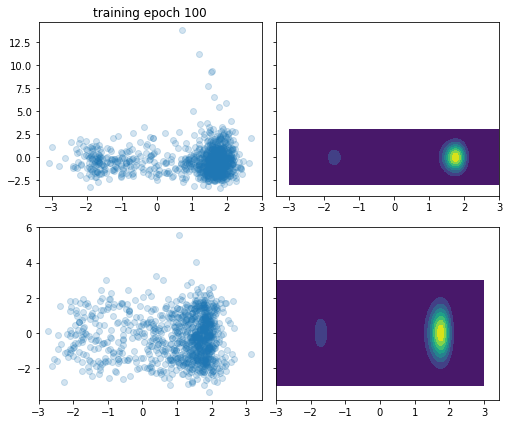

loss: -21.408021001016742, mean log p_x 12.322769782681469:  10%|█         | 200/2000 [00:39<05:30,  5.45it/s]

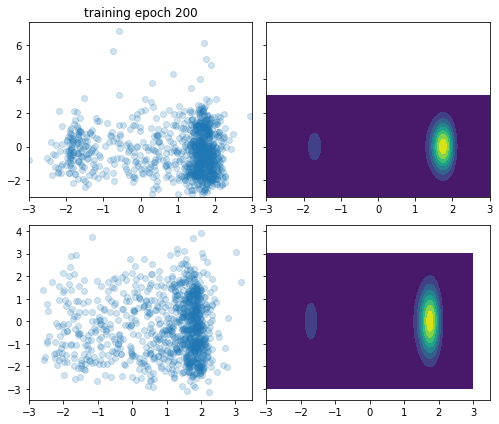

loss: -21.46268585596367, mean log p_x 12.431076152425723:  15%|█▌        | 300/2000 [00:59<05:16,  5.36it/s] 

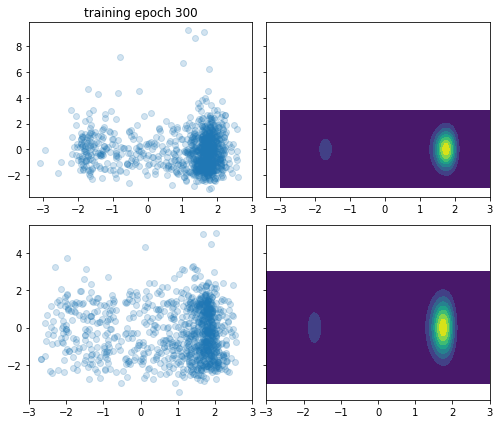

loss: -21.41733534944041, mean log p_x 12.736225633731406:  20%|██        | 400/2000 [01:19<04:50,  5.50it/s] 

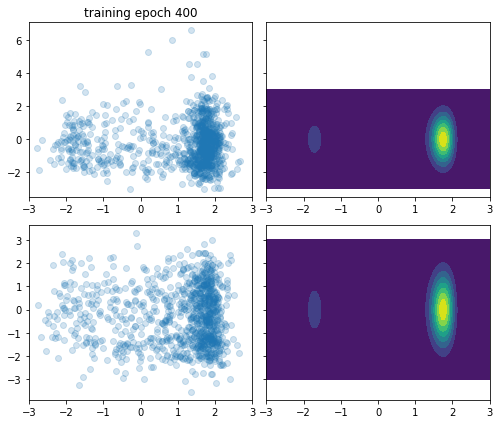

loss: -21.465024565331703, mean log p_x 12.774233249464258:  25%|██▌       | 500/2000 [01:38<04:38,  5.38it/s]

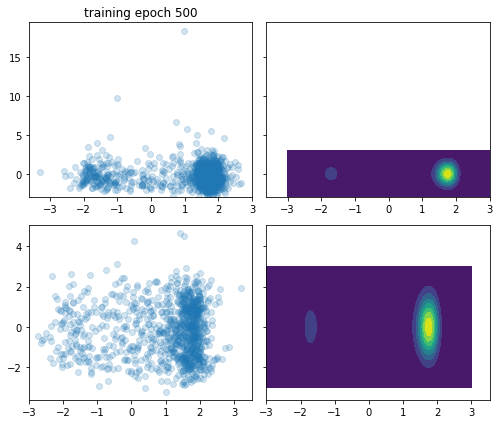

loss: -21.216701132182592, mean log p_x 12.446602688137673:  30%|███       | 600/2000 [01:58<04:18,  5.42it/s]

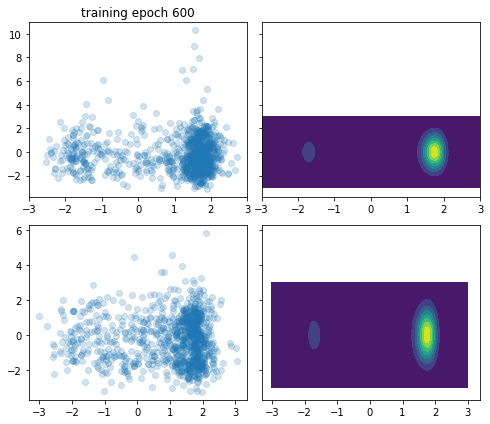

loss: -21.43414540412364, mean log p_x 12.850791429151649:  35%|███▌      | 700/2000 [02:18<04:00,  5.42it/s] 

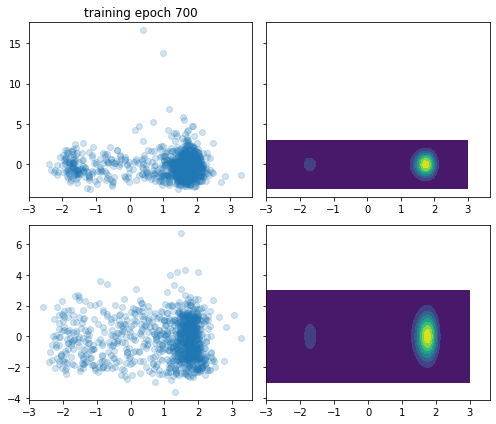

loss: -21.429538864303538, mean log p_x 12.754123429797911:  40%|████      | 800/2000 [02:38<03:44,  5.35it/s]

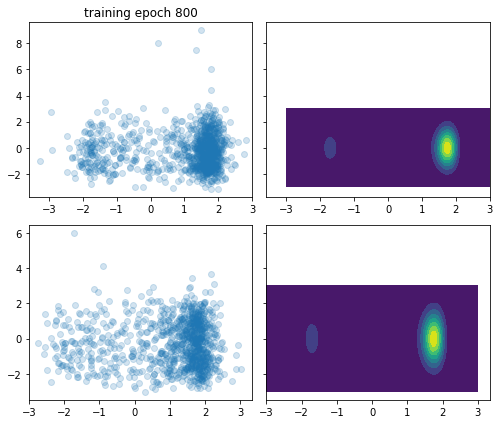

loss: -21.370284858921934, mean log p_x 12.643564664163:  45%|████▌     | 900/2000 [02:57<03:23,  5.40it/s]   

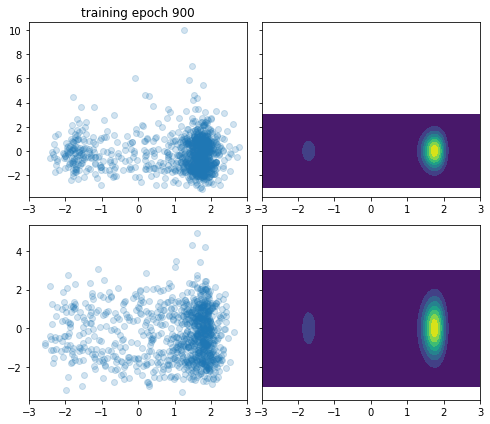

loss: -21.420415932566613, mean log p_x 12.456222993987774:  50%|█████     | 1000/2000 [03:17<03:05,  5.38it/s]

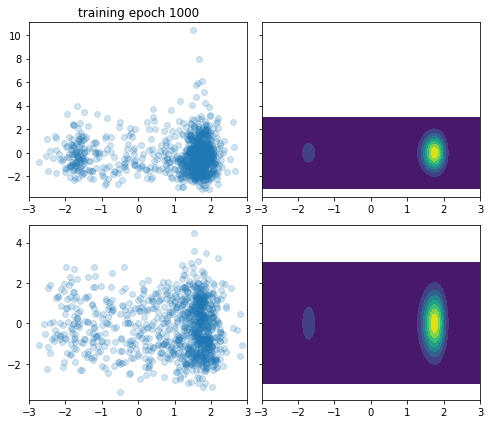

loss: -21.433208550678227, mean log p_x 12.792576650286842:  55%|█████▌    | 1100/2000 [03:36<02:46,  5.39it/s] 

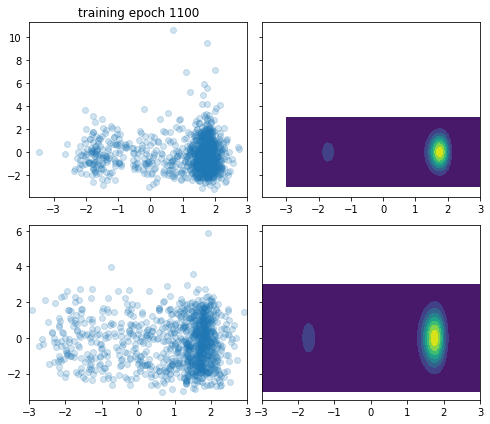

loss: -21.014992349291646, mean log p_x 13.184027788935405:  60%|██████    | 1200/2000 [03:56<02:44,  4.85it/s]

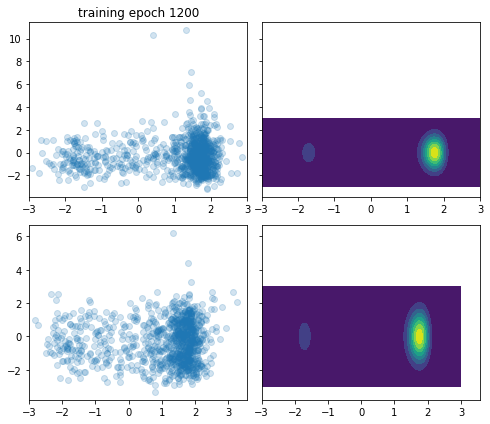

loss: -20.81122572210522, mean log p_x 12.790797637240635:  65%|██████▌   | 1300/2000 [04:18<02:09,  5.41it/s] 

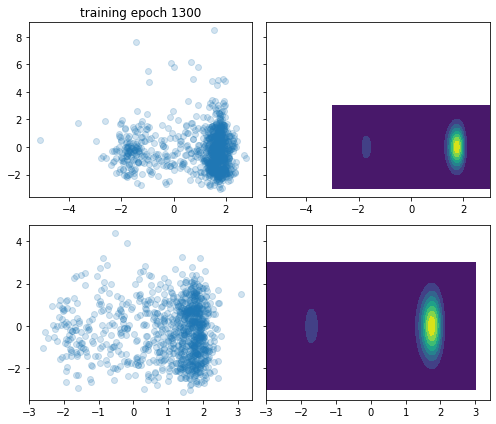

loss: -21.38218395142471, mean log p_x 12.883003567414416:  70%|███████   | 1400/2000 [04:41<01:55,  5.18it/s] 

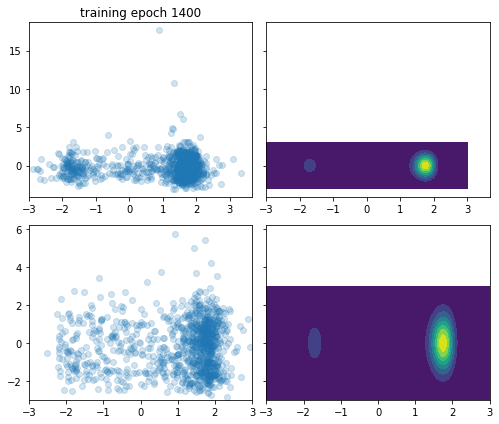

loss: -21.427457486285924, mean log p_x 12.79276049618971:  75%|███████▌  | 1500/2000 [05:02<01:43,  4.85it/s] 

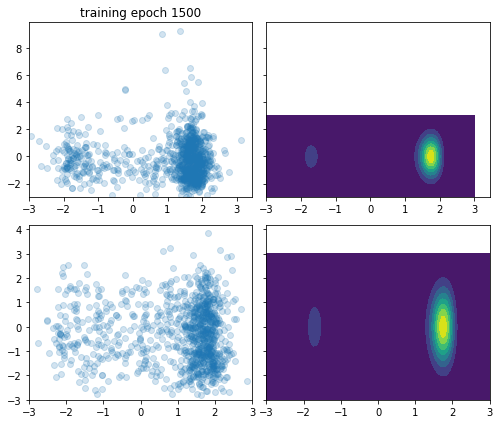

loss: -21.4593232474411, mean log p_x 12.352254975542627:  80%|████████  | 1600/2000 [05:23<01:21,  4.88it/s]  

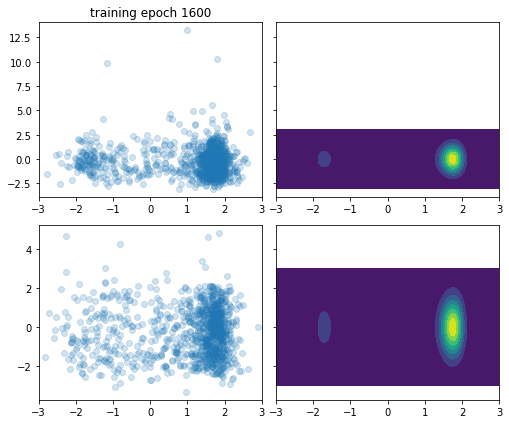

loss: -20.76490224664836, mean log p_x 12.912190308504643:  85%|████████▌ | 1700/2000 [05:45<01:06,  4.52it/s] 

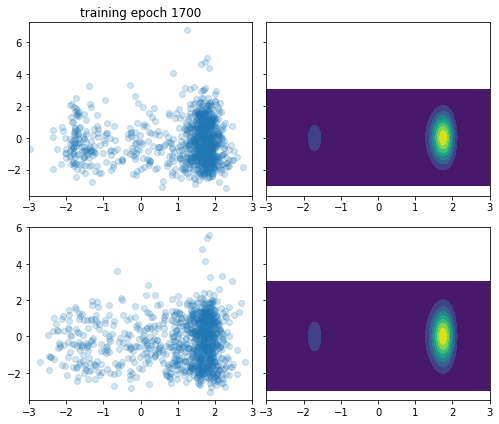

loss: -21.47990437023489, mean log p_x 13.119920173888104:  90%|█████████ | 1800/2000 [06:06<00:39,  5.08it/s] 

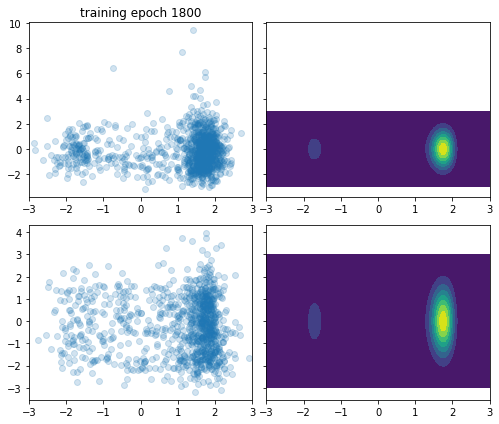

loss: -21.358072409334635, mean log p_x 12.850031229792837:  95%|█████████▌| 1900/2000 [06:27<00:20,  4.87it/s]

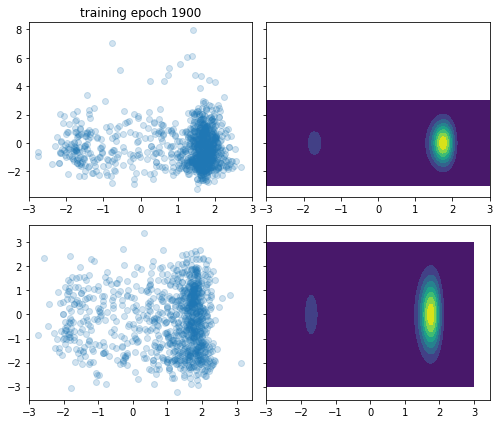

loss: -21.469378783225423, mean log p_x 12.553020946181158: 100%|██████████| 2000/2000 [06:48<00:00,  4.90it/s]


In [41]:
history = tester.train(2000, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

estimate before training is 23.45107589978393 
estimate after training is 23.39491374734223 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.34270452904408005
variance in weights is 1.9179847018940702e-10


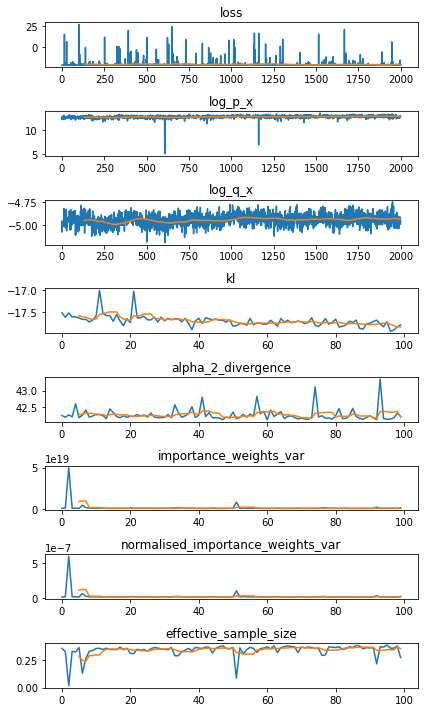

In [42]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")
plot_history(history)

loss: -21.48313905038267, mean log p_x 12.930653375439375:   0%|          | 0/5000 [00:00<?, ?it/s]

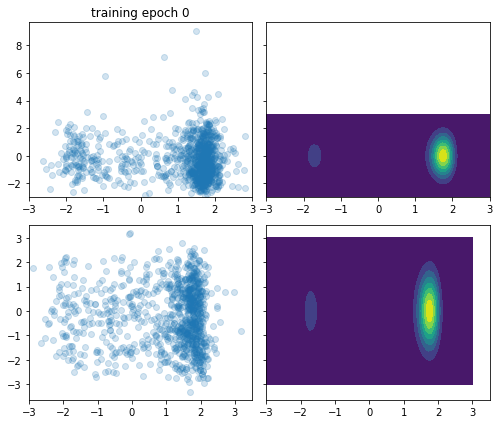

loss: -21.489266263557344, mean log p_x 12.903806523360874:   5%|▌         | 250/5000 [00:51<15:25,  5.13it/s]

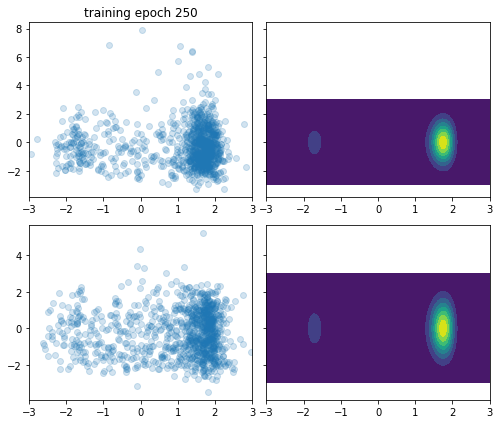

loss: -21.31007406554293, mean log p_x 12.730363616810628:  10%|█         | 500/5000 [01:43<14:31,  5.17it/s] 

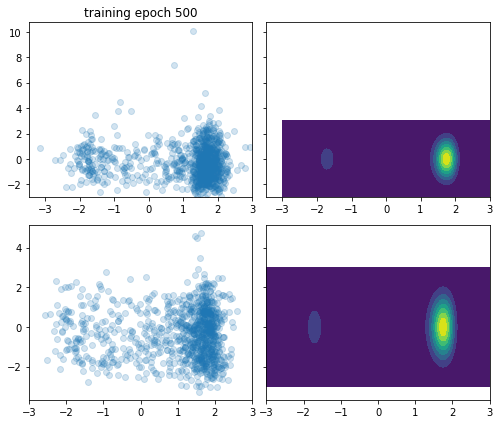

loss: -21.404344551790764, mean log p_x 13.080169850835329:  15%|█▌        | 750/5000 [02:33<14:17,  4.95it/s]

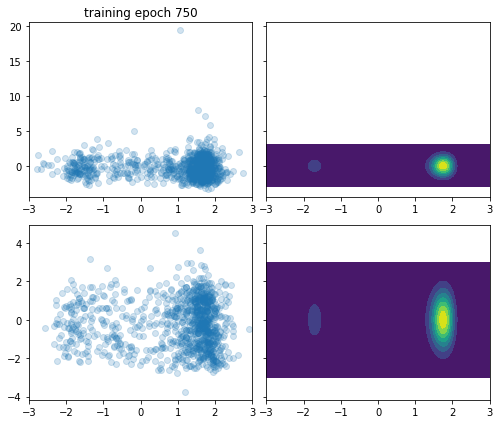

loss: -21.280688030413074, mean log p_x 13.251822113962913:  20%|██        | 1000/5000 [03:25<12:54,  5.16it/s]

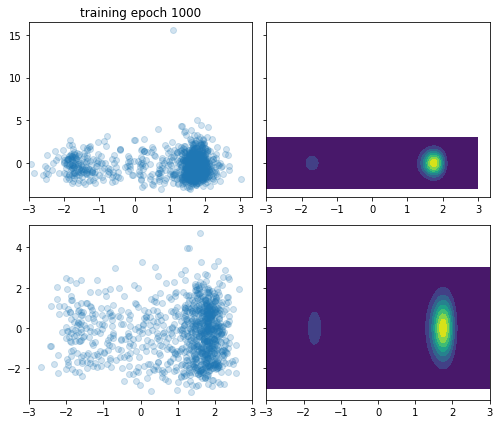

loss: -20.477339962070545, mean log p_x 13.155406680539036:  25%|██▌       | 1250/5000 [04:17<12:13,  5.11it/s]

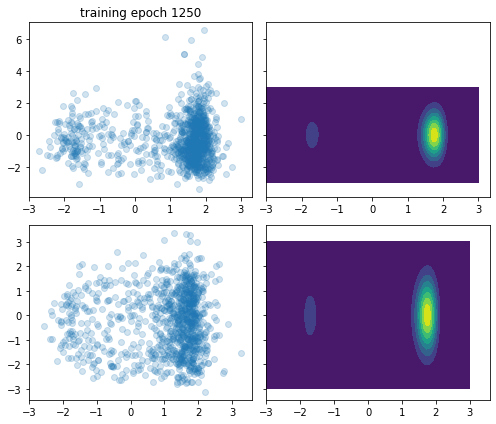

loss: -21.407017946084153, mean log p_x 12.981821129117998:  30%|███       | 1500/5000 [05:08<12:34,  4.64it/s]

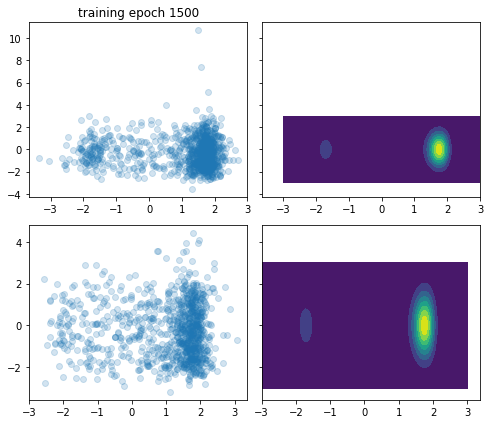

loss: -21.470805955211347, mean log p_x 13.217863715091095:  35%|███▌      | 1750/5000 [06:00<11:18,  4.79it/s]

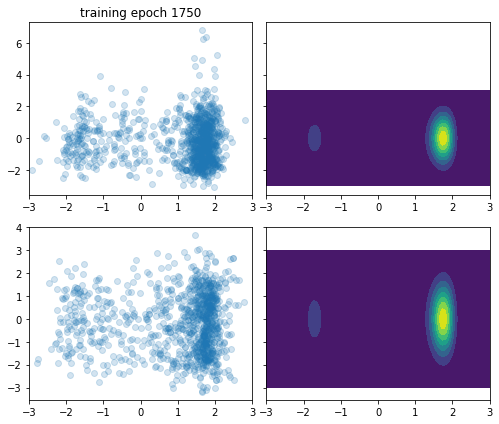

loss: 0.04077766013217232, mean log p_x 13.162885977821494:  40%|████      | 2000/5000 [06:52<09:45,  5.13it/s]

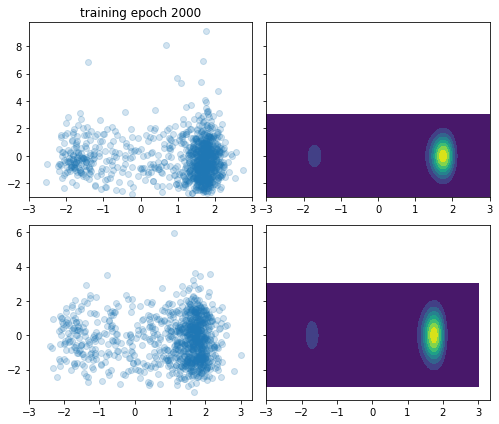

loss: -21.349985760140342, mean log p_x 13.088100712445481:  45%|████▌     | 2250/5000 [07:44<09:00,  5.09it/s]

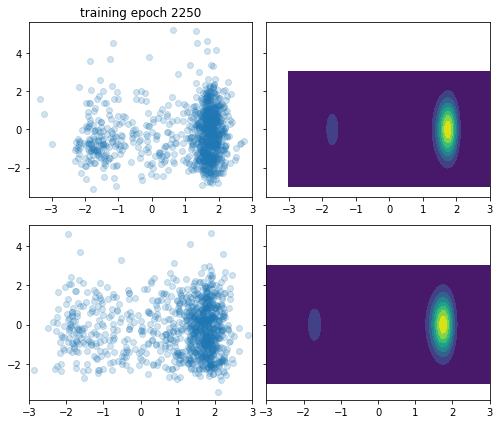

loss: -21.3817890833258, mean log p_x 12.955626508543418:  50%|█████     | 2500/5000 [08:36<09:33,  4.36it/s]  

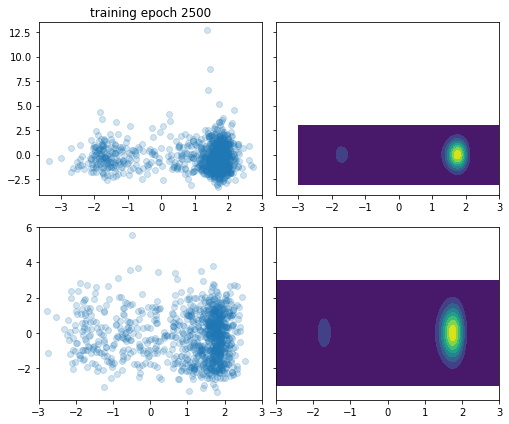

loss: -21.3945090777696, mean log p_x 13.215168546947895:  55%|█████▌    | 2750/5000 [09:29<07:40,  4.89it/s]  

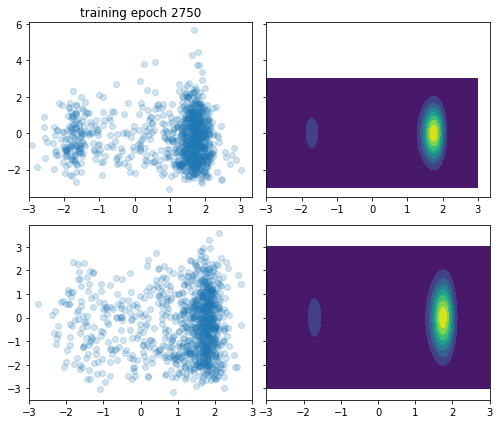

loss: -21.41301872510298, mean log p_x 13.410010242121233:  60%|██████    | 3000/5000 [10:21<06:53,  4.83it/s] 

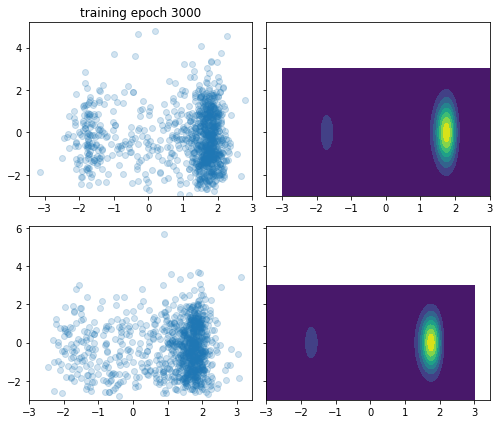

loss: -21.167141088425765, mean log p_x 12.964961069070448:  65%|██████▌   | 3250/5000 [11:13<05:49,  5.01it/s]

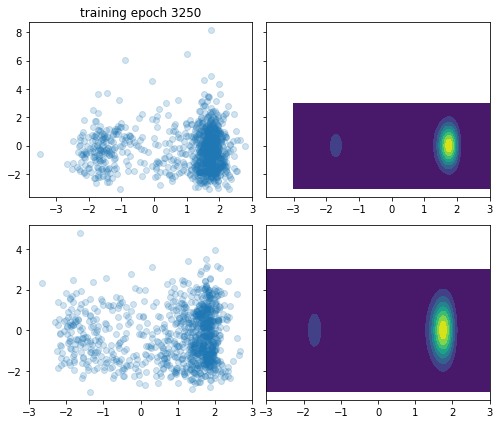

loss: -20.239287730489277, mean log p_x 13.352434467039908:  70%|███████   | 3500/5000 [12:06<05:10,  4.83it/s]

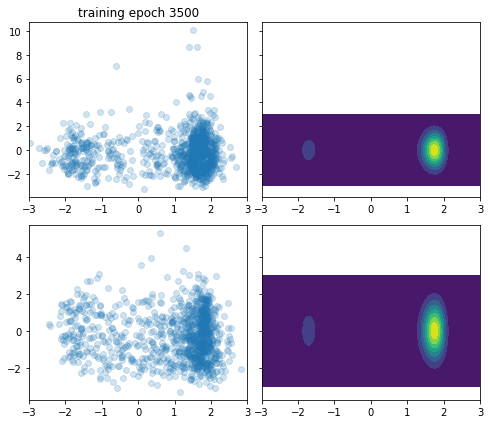

loss: -21.348458921807534, mean log p_x 13.29828831545397:  75%|███████▌  | 3750/5000 [12:58<04:16,  4.87it/s] 

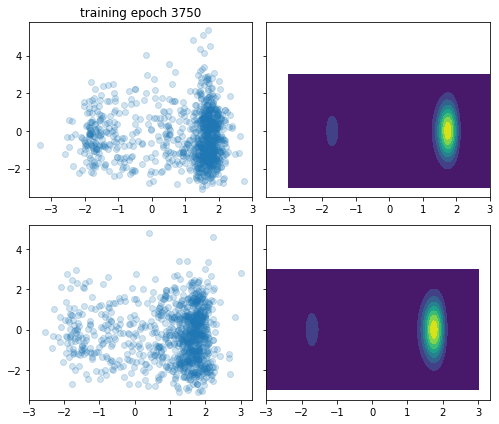

loss: -20.96202798506259, mean log p_x 13.202300723797148:  80%|████████  | 4000/5000 [13:50<03:23,  4.90it/s] 

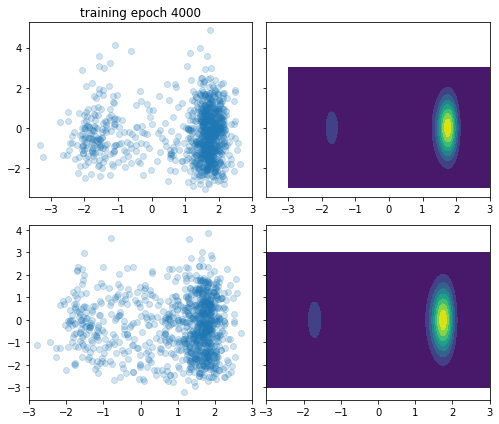

loss: -21.358759452216503, mean log p_x 13.604949088159284:  85%|████████▌ | 4250/5000 [14:42<02:33,  4.89it/s]

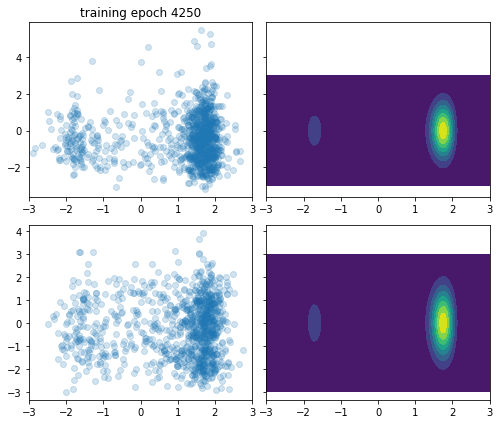

loss: -21.370879616566565, mean log p_x 13.255746295035006:  90%|█████████ | 4500/5000 [15:34<01:39,  5.05it/s]

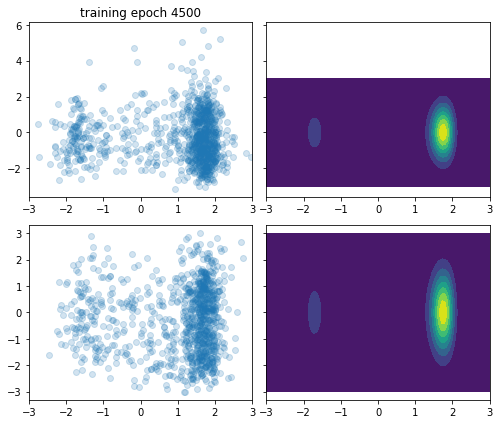

loss: -21.30103229667391, mean log p_x 13.425481339672107:  95%|█████████▌| 4750/5000 [16:26<00:49,  5.04it/s] 

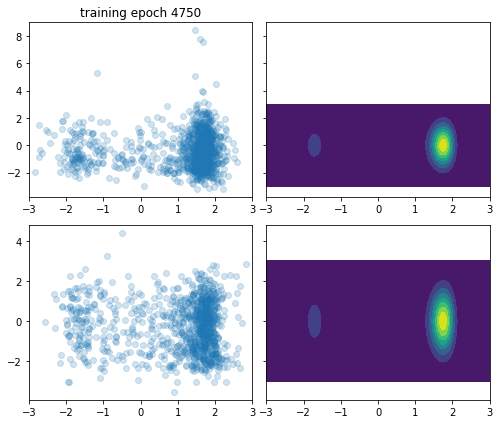

loss: -21.080766518451437, mean log p_x 13.675130513397628: 100%|██████████| 5000/5000 [17:18<00:00,  4.82it/s]


In [43]:
history = tester.train(5000, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

estimate before training is 23.45107589978393 
estimate after training is 23.36386963137746 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.3978328608073321
variance in weights is 1.5136335387234659e-10


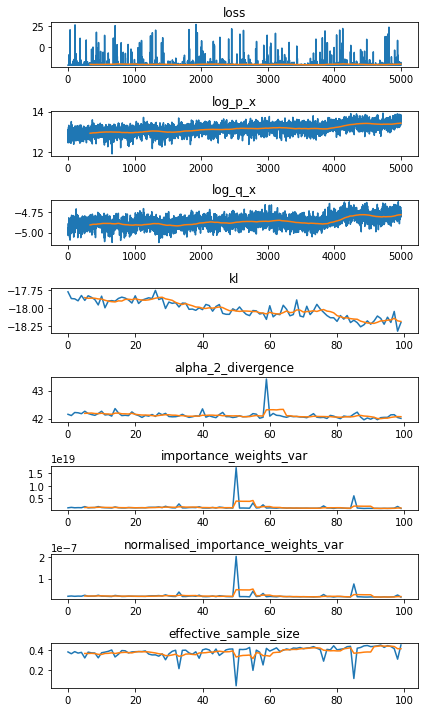

In [44]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")
plot_history(history)

loss: -21.249198787377672, mean log p_x 13.695803667951296:   0%|          | 0/10000 [00:00<?, ?it/s]

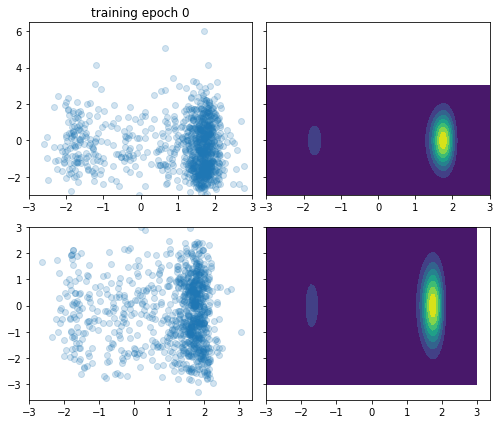

loss: -21.252387954797175, mean log p_x 13.104240779668503:   5%|▌         | 500/10000 [01:41<31:53,  4.97it/s]

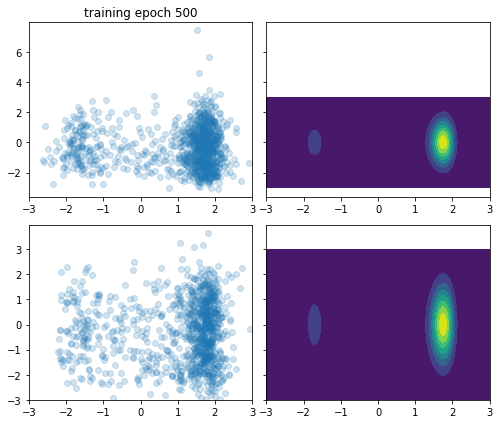

loss: -21.339425685813143, mean log p_x 13.6637953938149:  10%|█         | 1000/10000 [03:22<36:42,  4.09it/s]   

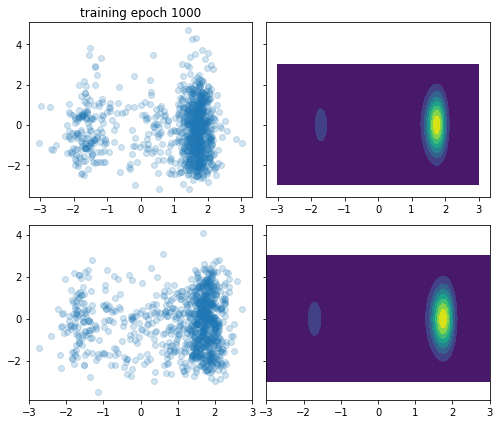

loss: -21.26234386855506, mean log p_x 13.522045024535212:  15%|█▌        | 1500/10000 [05:05<29:21,  4.82it/s] 

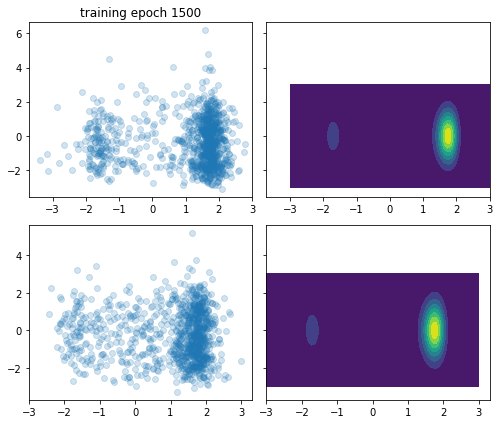

loss: -21.229076236280466, mean log p_x 13.706275086871678:  20%|██        | 2000/10000 [06:47<26:00,  5.13it/s]

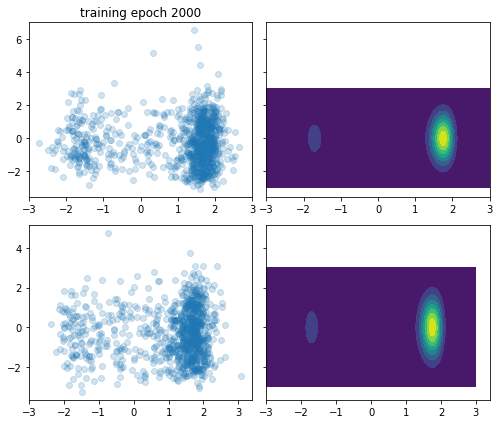

loss: -21.18644105064634, mean log p_x 13.644027282837607:  25%|██▌       | 2500/10000 [08:29<27:52,  4.49it/s] 

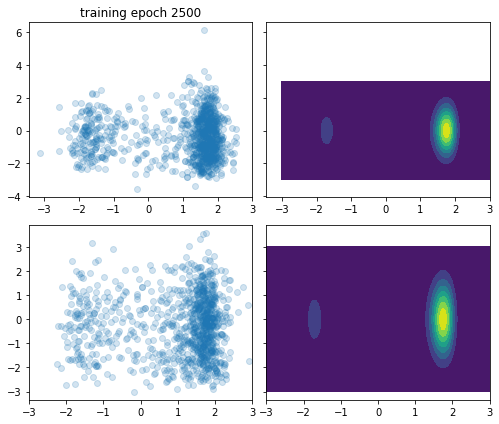

loss: -20.976380068623772, mean log p_x 13.823872587569221:  30%|███       | 3000/10000 [10:11<22:25,  5.20it/s]

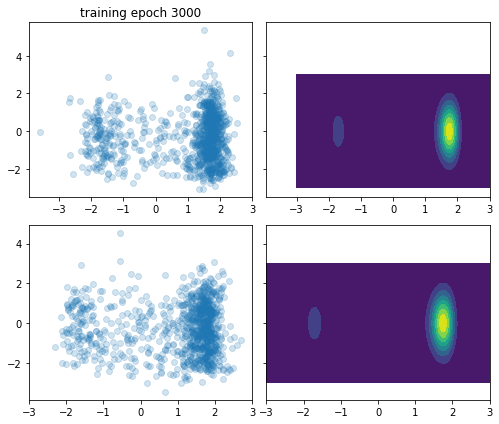

loss: -19.80110551159162, mean log p_x 13.673750831403009:  35%|███▌      | 3500/10000 [11:52<21:06,  5.13it/s] 

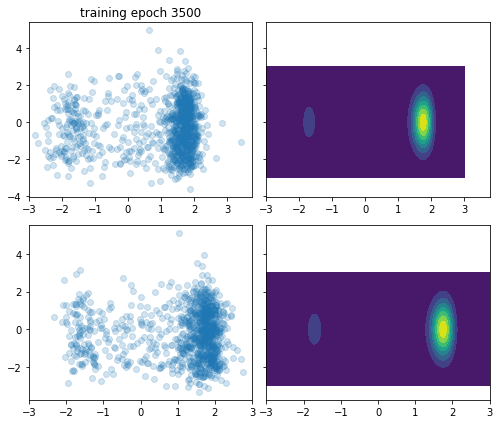

loss: -20.82153258881538, mean log p_x 13.86228536074981:  40%|████      | 4000/10000 [13:34<20:14,  4.94it/s]  

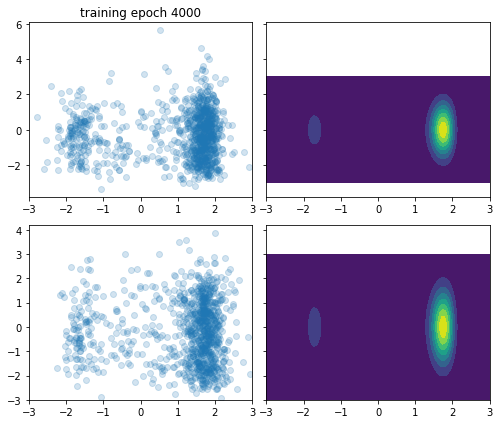

loss: -21.199045316951263, mean log p_x 13.94923708086801:  45%|████▌     | 4500/10000 [15:16<17:49,  5.14it/s] 

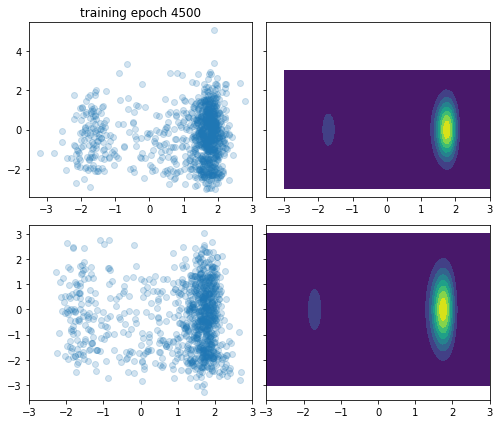

loss: -21.127851177107686, mean log p_x 13.781268052796756:  50%|█████     | 5000/10000 [16:58<16:39,  5.00it/s]

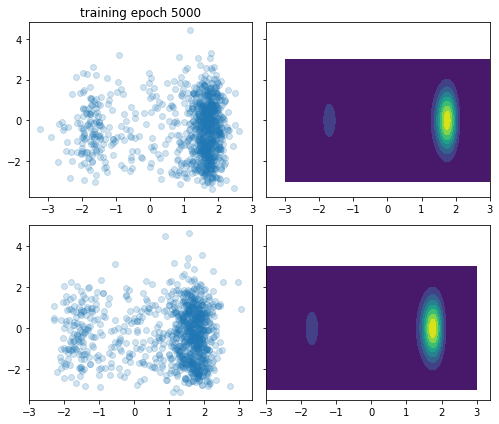

loss: -21.13538705420094, mean log p_x 14.047480067472021:  55%|█████▌    | 5500/10000 [18:38<14:18,  5.24it/s] 

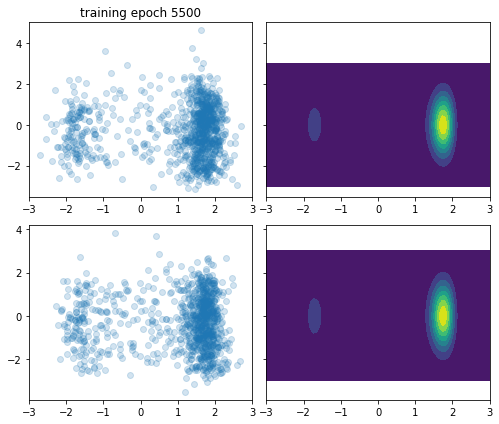

loss: -21.236153064740964, mean log p_x 14.256906105898626:  60%|██████    | 6000/10000 [20:20<12:54,  5.16it/s]

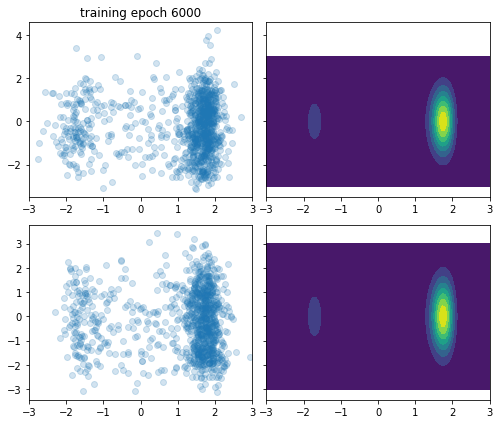

loss: -21.160435107824355, mean log p_x 14.420864102979518:  65%|██████▌   | 6500/10000 [22:09<14:42,  3.97it/s]

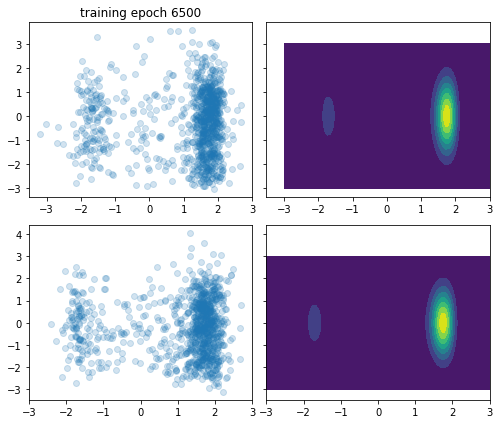

loss: -21.13143531110234, mean log p_x 14.16848993014328:  70%|███████   | 7000/10000 [23:51<09:48,  5.10it/s]  

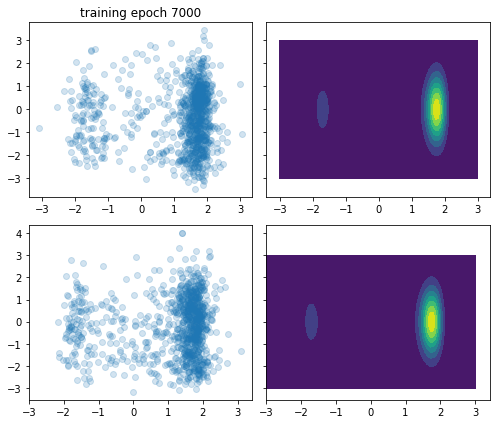

loss: -21.15744679595995, mean log p_x 14.406746103502206:  75%|███████▌  | 7500/10000 [25:32<08:34,  4.85it/s] 

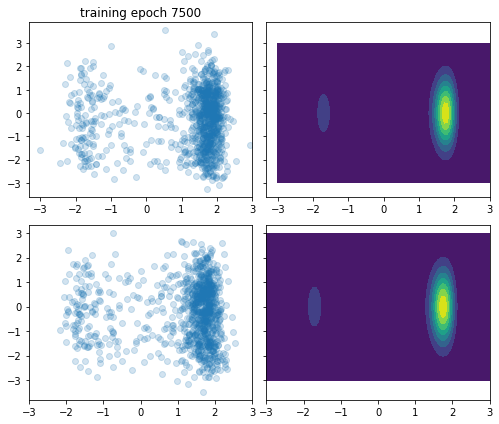

loss: -21.115380454440277, mean log p_x 14.303630804903822:  80%|████████  | 8000/10000 [27:13<06:42,  4.97it/s]

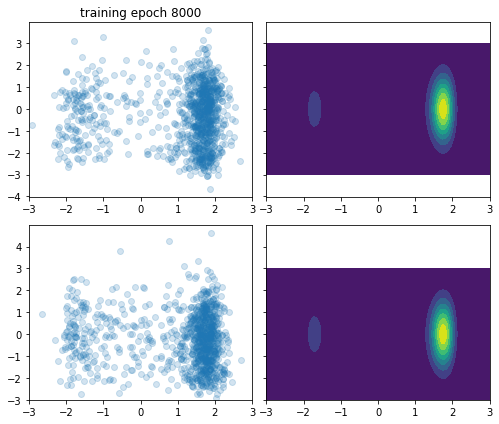

loss: -21.095510141099258, mean log p_x 14.215749247712587:  85%|████████▌ | 8500/10000 [28:56<05:12,  4.79it/s]

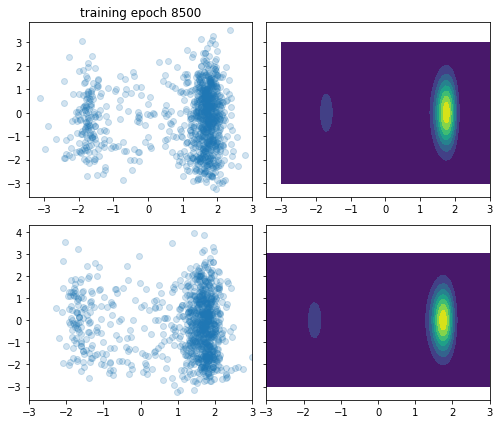

loss: -20.943033431674422, mean log p_x 14.224094358303693:  90%|█████████ | 9000/10000 [30:37<03:18,  5.05it/s]

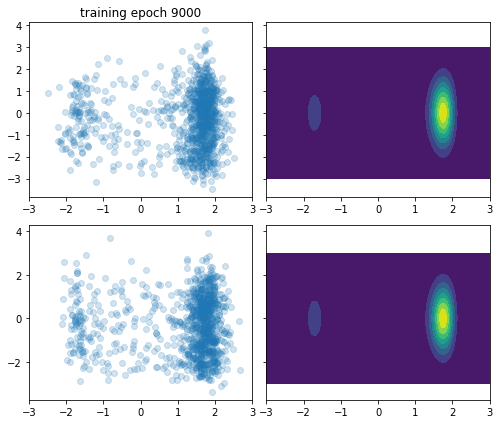

loss: -20.921333753517402, mean log p_x 14.177711149577211:  95%|█████████▌| 9500/10000 [32:19<01:41,  4.95it/s]

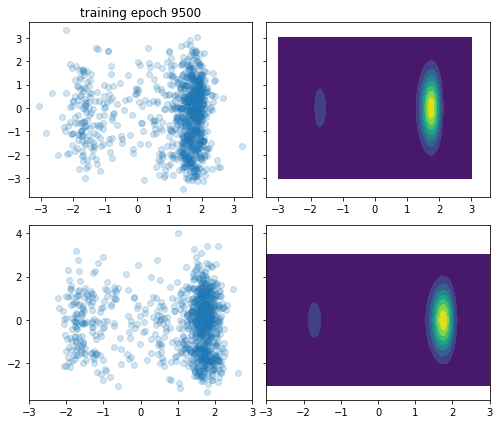

loss: -21.1281967518513, mean log p_x 14.222862168123513: 100%|██████████| 10000/10000 [34:00<00:00,  4.90it/s] 


In [45]:
history = tester.train(10000, batch_size=batch_size, clip_grad_norm=clip_grad_norm, max_grad_norm=1,
                       intermediate_plots=True, plotting_func=plotter, n_plots=n_plots)

estimate before training is 23.45107589978393 
estimate after training is 23.39819872609321 
effective sample size before is 0.012207940985827186
effective sample size after train is 0.5650595367060957
variance in weights is 7.697327175070146e-11


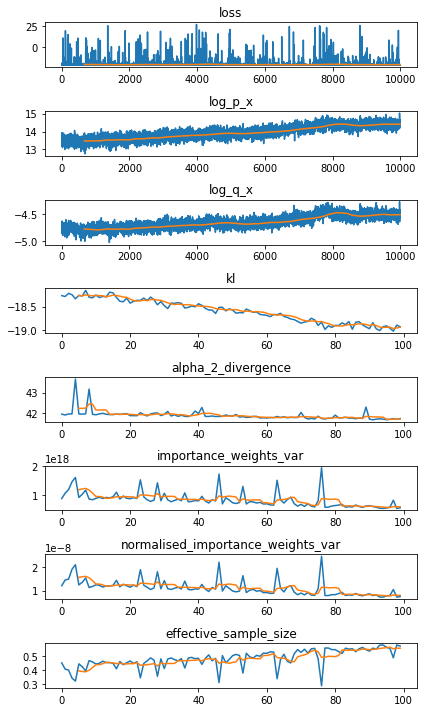

In [46]:
expectation, info = tester.estimate_expectation(n_samples_estimation, expectation_function)

print(f"estimate before training is {expectation_before} \n"
      f"estimate after training is {expectation} \n"
      f"effective sample size before is {info_before['effective_sample_size'] / n_samples_estimation}\n"
      f"effective sample size after train is {info['effective_sample_size'] / n_samples_estimation}\n"
      f"variance in weights is {torch.var(info['normalised_sampling_weights'])}")
plot_history(history)